# 🦠🤖 **Machine Learning–Based Diagnosis of COVID-19 Using Clinical and Laboratory Data**


<img src="v1.jpeg" style="display:block; margin:auto; width:100%;">



**La pandémie de COVID-19 a profondément marqué les systèmes de santé à l’échelle mondiale, mettant en évidence la nécessité de disposer d’outils rapides, fiables et automatisés pour aider au diagnostic médical. Le test PCR, bien qu’étant la référence, présente certaines limites pratiques : délai d’obtention des résultats, disponibilité du matériel et coût, en particulier dans les contextes hospitaliers sous forte pression.

Dans ce contexte, l’exploitation des données cliniques et biologiques à l’aide du Machine Learning constitue une approche prometteuse pour assister les professionnels de santé dans la prise de décision. Les examens sanguins et tests cliniques, réalisés de manière routinière à l’admission des patients, contiennent une information précieuse susceptible de révéler des signatures biologiques associées à l’infection par le SARS-CoV-2.

L’objectif principal de ce projet est de développer et d’évaluer des modèles de Machine Learning capables de prédire le diagnostic du COVID-19 à partir de données cliniques, démographiques et de résultats d’analyses de laboratoire. Le projet s’appuie sur un jeu de données réel, issu d’un hôpital brésilien et mis à disposition sur la plateforme Kaggle, comprenant plus de 5 000 patients et plus de 100 variables médicales.

👉 Dataset : Diagnosis of COVID-19 and its Clinical Spectrum
👉 Source : https://www.kaggle.com/datasets/einsteindata4u/covid19**


 -  #### <font color = bleu> **Objectifs du projet** :</span>

- **Analyser en profondeur un jeu de données clinique réel afin de mieux comprendre les manifestations biologiques et virologiques associées à l’infection par le SARS-CoV-2.**
- **Mettre en évidence les variables cliniques et biologiques les plus pertinentes pour le diagnostic du COVID-19, en s’appuyant sur des analyses statistiques et exploratoires rigoureuses.**
- **Étudier les relations entre les paramètres sanguins, les tests viraux et le statut COVID-19 afin d’identifier des patterns médicaux exploitables.**
- **Évaluer l’impact des caractéristiques des patients (âge, résultats biologiques, co-infections virales) sur la probabilité de contamination au COVID-19.**
- **Gérer et comprendre la problématique des valeurs manquantes dans les données médicales et proposer des stratégies adaptées pour leur traitement.**
- **Poser des bases solides pour la construction de modèles de machine learning fiables, interprétables et orientés diagnostic médical.**
- **Contribuer à une meilleure compréhension du potentiel des données cliniques et de laboratoire dans l’aide à la décision médicale et le diagnostic assisté par ordinateur.**


- #### <font color = bleu>  **Problematique centrale du projet** :</span>

Dans un contexte de données médicales réelles caractérisées par un fort taux de valeurs manquantes, une hétérogénéité des variables et un déséquilibre des classes, comment concevoir une approche data-driven permettant d’identifier les facteurs cliniques et biologiques les plus discriminants du COVID-19, tout en garantissant des performances prédictives élevées et une interprétabilité compatible avec les exigences du domaine médical ?

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [6]:
import os
print(os.path.exists(r"C:\Users\lenovo\Downloads\dataset (2).xlsx"))


True


In [7]:
pd.set_option('display.max_row', 111)
pd.set_option('display.max_column', 111)

In [8]:
data = pd.read_excel(r"C:\Users\lenovo\Downloads\dataset (2).xlsx")
data.head()

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Serum Glucose,Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Mycoplasma pneumoniae,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,Neutrophils,Urea,Proteina C reativa mg/dL,Creatinine,Potassium,Sodium,"Influenza B, rapid test","Influenza A, rapid test",Alanine transaminase,Aspartate transaminase,Gamma-glutamyltransferase,Total Bilirubin,Direct Bilirubin,Indirect Bilirubin,Alkaline phosphatase,Ionized calcium,Strepto A,Magnesium,pCO2 (venous blood gas analysis),Hb saturation (venous blood gas analysis),Base excess (venous blood gas analysis),pO2 (venous blood gas analysis),Fio2 (venous blood gas analysis),Total CO2 (venous blood gas analysis),pH (venous blood gas analysis),HCO3 (venous blood gas analysis),Rods #,Segmented,Promyelocytes,Metamyelocytes,Myelocytes,Myeloblasts,Urine - Esterase,Urine - Aspect,Urine - pH,Urine - Hemoglobin,Urine - Bile pigments,Urine - Ketone Bodies,Urine - Nitrite,Urine - Density,Urine - Urobilinogen,Urine - Protein,Urine - Sugar,Urine - Leukocytes,Urine - Crystals,Urine - Red blood cells,Urine - Hyaline cylinders,Urine - Granular cylinders,Urine - Yeasts,Urine - Color,Partial thromboplastin time (PTT),Relationship (Patient/Normal),International normalized ratio (INR),Lactic Dehydrogenase,"Prothrombin time (PT), Activity",Vitamin B12,Creatine phosphokinase (CPK),Ferritin,Arterial Lactic Acid,Lipase dosage,D-Dimer,Albumin,Hb saturation (arterial blood gases),pCO2 (arterial blood gas analysis),Base excess (arterial blood gas analysis),pH (arterial blood gas analysis),Total CO2 (arterial blood gas analysis),HCO3 (arterial blood gas analysis),pO2 (arterial blood gas analysis),Arteiral Fio2,Phosphor,ctO2 (arterial blood gas analysis)
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,0.102004,0.318366,-0.95079,-0.09461,-0.223767,-0.292269,1.482158,0.166192,0.357547,-0.625073,-0.140648,not_detected,not_detected,not_detected,not_detected,not_detected,detected,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,-0.619086,1.198059,-0.147895,2.089928,-0.305787,0.862512,negative,negative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

# 1. Analyse Exploratoire des Données (EDA)

## Objectifs
- Acquérir une compréhension approfondie des données disponibles afin d’orienter l’analyse et la modélisation.
- Développer une première stratégie de modélisation basée sur les caractéristiques observées.

## Checklist de base

### Analyse de Forme
- **Variable cible (target)** : Résultat du test SARS-CoV-2.
- **Dimensions du dataset** : 5644 lignes et 111 colonnes.
- **Types de variables** :
  - Qualitatives : 70
  - Quantitatives : 41
- **Analyse des valeurs manquantes** :
  - Présence importante de NaN (plus de la moitié des variables ont >90% de valeurs manquantes).
  - Deux groupes principaux : tests viraux (~76% de NaN) et tests sanguins (~89% de NaN).

### Analyse de Fond
- **Distribution de la cible** :
  - 10% des individus sont positifs au COVID-19 (558 / 5000).
- **Signification des variables** :
  - Variables continues : standardisées, certaines asymétriques, principalement des tests sanguins.
  - Âge : présenté sous forme de quantiles, difficilement interprétable (traitement ou transformation inconnue).
  - Variables qualitatives : binaires (0,1), incluant tests viraux ; Rhinovirus présente des valeurs très élevées.
- **Relations variables / target** :
  - **Blood / Target** : Les taux de leucocytes, monocytes et plaquettes semblent associés au COVID-19 — hypothèse à vérifier.
  - **Âge / Target** : Les individus jeunes apparaissent moins contaminés, mais l’âge exact et la période du dataset sont inconnus. Cette variable peut être intéressante en corrélation avec les tests sanguins.
  - **Viral / Target** : Co-infections rares (ex. Rhinovirus/Enterovirus positif et COVID-19 négatif). Nécessité de vérifier les liens éventuels avec le COVID-19, bien que des co-infections puissent survenir indépendamment.

## Analyse Détaillée

- **Relations Variables / Variables** :
  - **Tests sanguins entre eux** : certaines variables fortement corrélées (r > 0.9) — à surveiller.
  - **Tests sanguins / Âge** : corrélation faible.
  - **Tests viraux entre eux** : certaines mesures comme l’Influenza Rapid Test semblent peu fiables — envisager de les exclure.
  - **Maladie / Tests sanguins** : les profils sanguins diffèrent selon le statut COVID-19.
  - **Hospitalisation / Statut malade** : potentiel indicateur pour la prédiction du service hospitalier.
  - **Hospitalisation / Tests sanguins** : pertinent pour évaluer le service approprié pour le patient.

- **Analyse des NaN** :
  - Tests viraux : 1350 (92% manquants / 8% présents)
  - Tests sanguins : 600 (87% manquants / 13% présents)
  - Les deux : 90

## Hypothèses à tester

- **H0 (taux sanguins / COVID-19)** :  
  Les individus positifs et négatifs au COVID-19 présentent des taux de leucocytes, monocytes et plaquettes équivalents.  
  _H0 : les moyennes des taux sont égales chez les deux groupes._

- **H0 (taux sanguins / maladies diverses)** :  
  Les individus atteints d’une maladie quelconque n’ont pas de différences significatives dans leurs taux sanguins.


In [9]:
df = data.copy()

In [10]:
df.shape

(5644, 111)

<Axes: ylabel='count'>

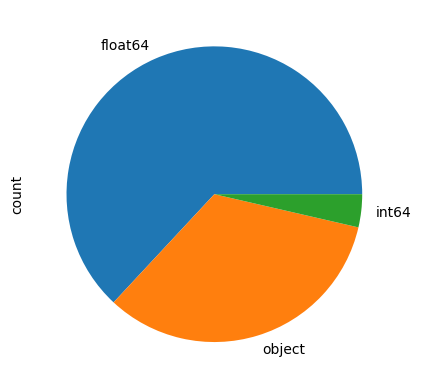

In [11]:
df.dtypes.value_counts().plot.pie()

<Axes: >

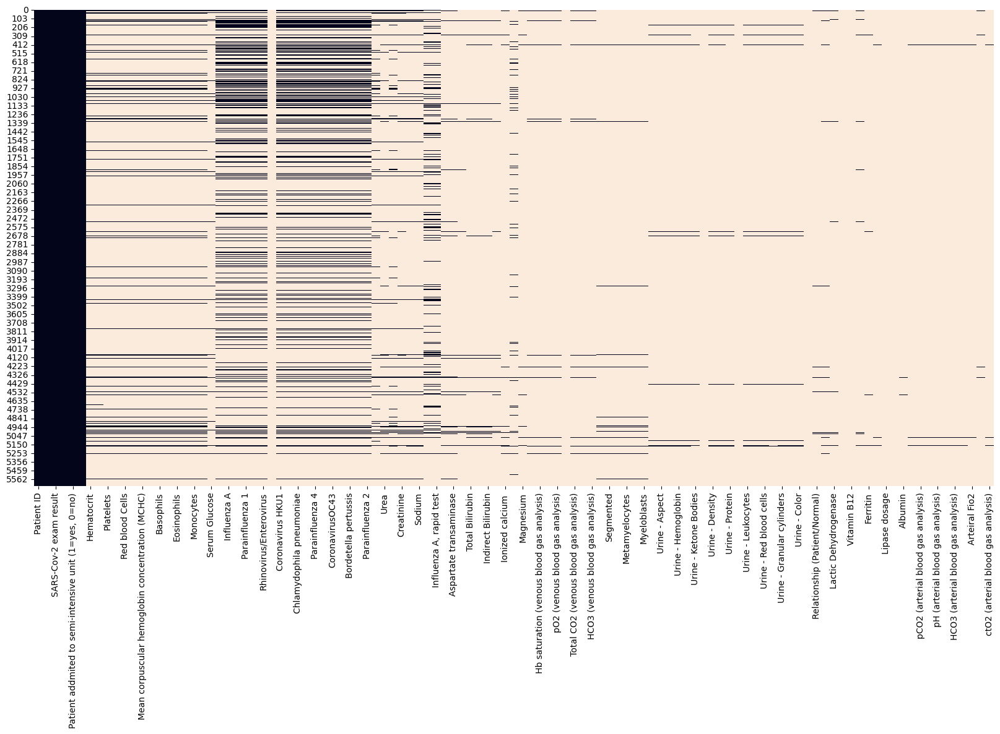

In [12]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(), cbar=False)

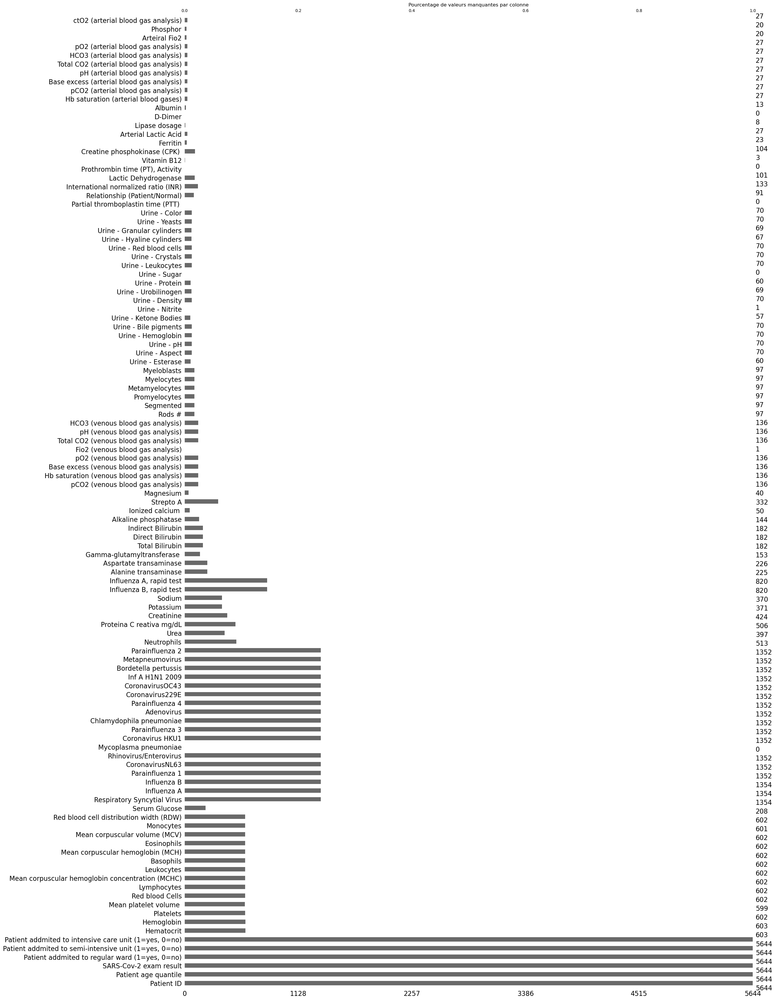

In [13]:
plt.figure(figsize=(10, 6))
msno.bar(df)
plt.title('Pourcentage de valeurs manquantes par colonne')
plt.show()

In [14]:
(df.isna().sum()/df.shape[0]).sort_values(ascending=True)

Patient ID                                               0.000000
Patient age quantile                                     0.000000
SARS-Cov-2 exam result                                   0.000000
Patient addmited to regular ward (1=yes, 0=no)           0.000000
Patient addmited to semi-intensive unit (1=yes, 0=no)    0.000000
Patient addmited to intensive care unit (1=yes, 0=no)    0.000000
Influenza B                                              0.760099
Respiratory Syncytial Virus                              0.760099
Influenza A                                              0.760099
Rhinovirus/Enterovirus                                   0.760454
Inf A H1N1 2009                                          0.760454
CoronavirusOC43                                          0.760454
Coronavirus229E                                          0.760454
Parainfluenza 4                                          0.760454
Adenovirus                                               0.760454
Chlamydoph

In [15]:
df = df[df.columns[df.isna().sum()/df.shape[0] <0.9]]
df.head()

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,0.102004,0.318366,-0.95079,-0.09461,-0.223767,-0.292269,1.482158,0.166192,0.357547,-0.625073,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f7d619a94f97c45,5,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,d9e41465789c2b5,15,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN


<Axes: >

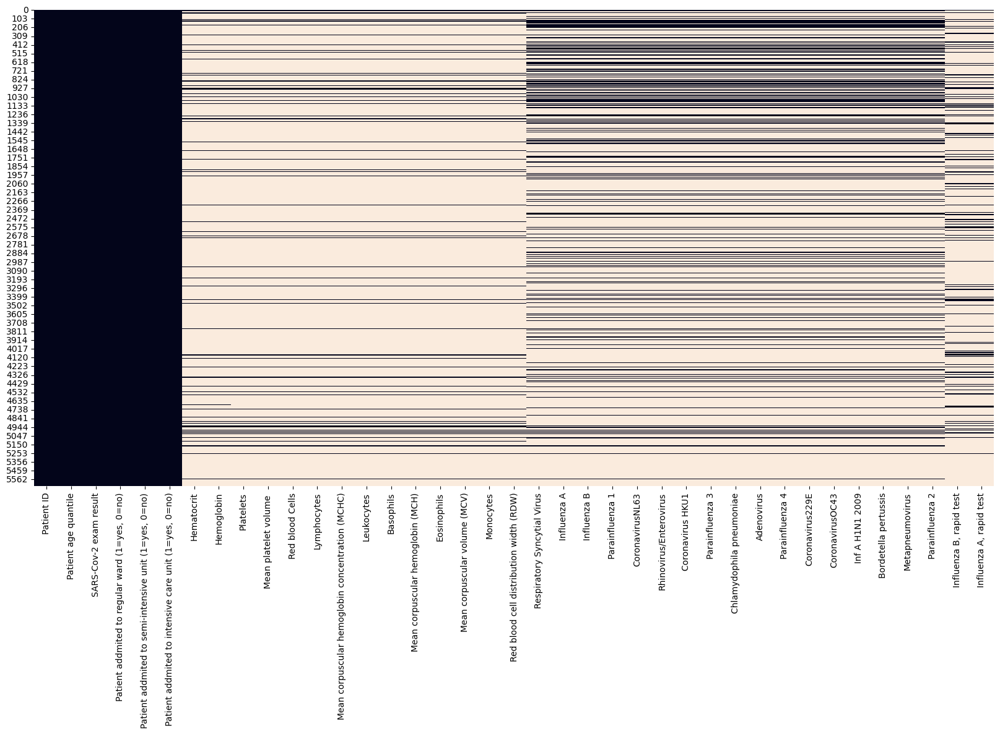

In [16]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(), cbar=False)

In [17]:
df.head()

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,0.102004,0.318366,-0.95079,-0.09461,-0.223767,-0.292269,1.482158,0.166192,0.357547,-0.625073,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f7d619a94f97c45,5,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,d9e41465789c2b5,15,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN


In [18]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Patient age quantile,5644.0,9.318391e+00,5.777903,0.000000,4.000000,9.000000,14.000000,19.000000
"Patient addmited to regular ward (1=yes, 0=no)",5644.0,1.399717e-02,0.117489,0.000000,0.000000,0.000000,0.000000,1.000000
"Patient addmited to semi-intensive unit (1=yes, 0=no)",5644.0,8.858965e-03,0.093713,0.000000,0.000000,0.000000,0.000000,1.000000
"Patient addmited to intensive care unit (1=yes, 0=no)",5644.0,7.264352e-03,0.084929,0.000000,0.000000,0.000000,0.000000,1.000000
Hematocrit,603.0,-2.186214e-09,1.000830,-4.501420,-0.518807,0.053407,0.717175,2.662704
Hemoglobin,603.0,-1.601319e-08,1.000830,-4.345603,-0.586244,0.040316,0.729532,2.671868
Platelets,602.0,-3.535004e-10,1.000832,-2.552426,-0.605346,-0.121716,0.531498,9.532034
Mean platelet volume,599.0,7.438142e-09,1.000836,-2.457575,-0.662483,-0.101517,0.683835,3.713052
Red blood Cells,602.0,8.424447e-09,1.000832,-3.970608,-0.567950,0.013852,0.666176,3.645706
Lymphocytes,602.0,-7.866736e-09,1.000832,-1.865070,-0.730707,-0.014267,0.597692,3.764100


In [19]:
def detect_and_plot_outliers(
    df,
    show_plots=True,
    iqr_factor=1.5,
    max_plots_per_row=3
):
  

    numerical_columns = df.select_dtypes(include=[np.number]).columns
    outlier_summary = {}

    for col in numerical_columns:
        data = df[col].dropna()
        if len(data) < 10:
            continue  

        Q1 = data.quantile(0.25)
        Q3 = data.quantile(0.75)
        IQR = Q3 - Q1

        lower = Q1 - iqr_factor * IQR
        upper = Q3 + iqr_factor * IQR

        n_outliers = ((data < lower) | (data > upper)).sum()

        if n_outliers > 0:
            outlier_summary[col] = n_outliers

    if show_plots and len(outlier_summary) > 0:
        vars_to_plot = list(outlier_summary.keys())
        n_vars = len(vars_to_plot)
        n_rows = int(np.ceil(n_vars / max_plots_per_row))

        plt.figure(figsize=(6 * max_plots_per_row, 4 * n_rows))

        for i, col in enumerate(vars_to_plot, 1):
            plt.subplot(n_rows, max_plots_per_row, i)
            sns.boxplot(x=df[col], color="skyblue")
            plt.title(f"{col}\nOutliers: {outlier_summary[col]}")
            plt.xlabel("")
            plt.grid(True)

        plt.tight_layout()
        plt.show()

    return outlier_summary


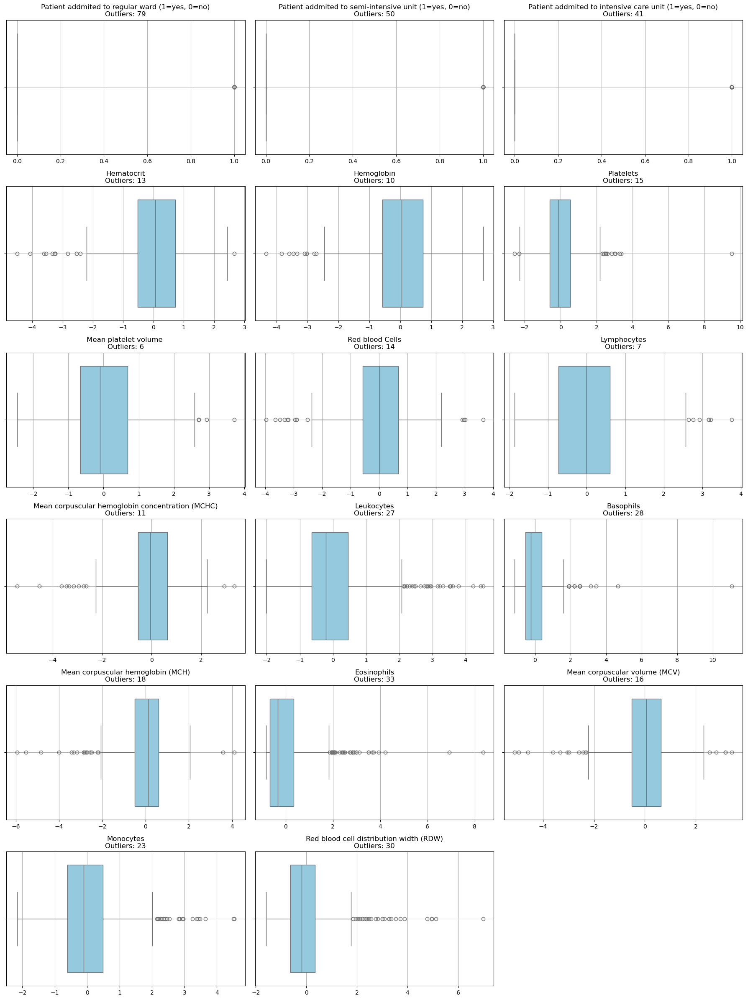

In [20]:
outliers_detected = detect_and_plot_outliers(df)


In [21]:
df['SARS-Cov-2 exam result'].value_counts(normalize=True)

SARS-Cov-2 exam result
negative    0.901134
positive    0.098866
Name: proportion, dtype: float64

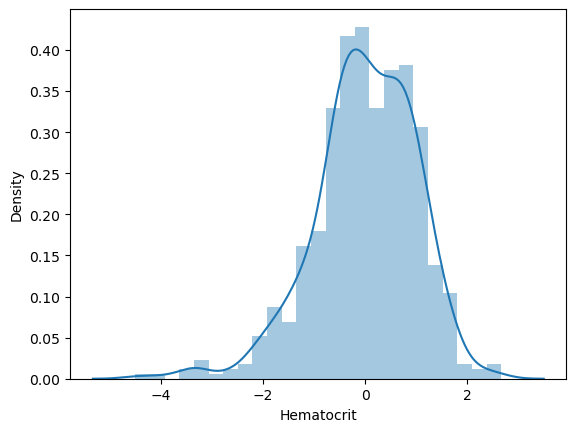

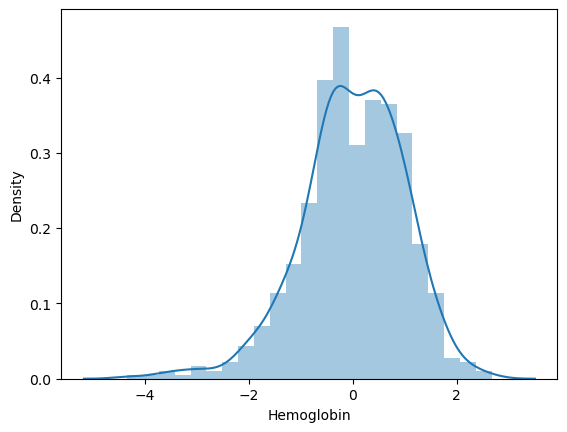

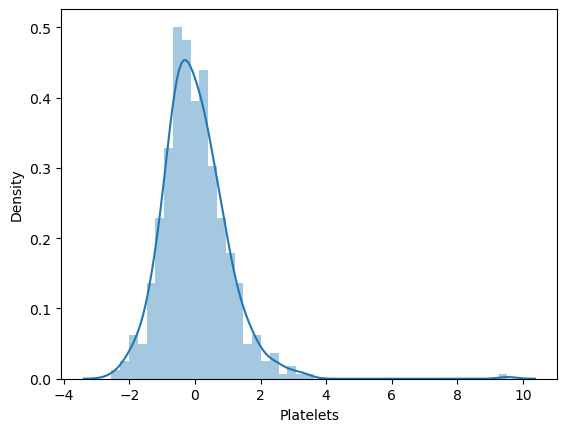

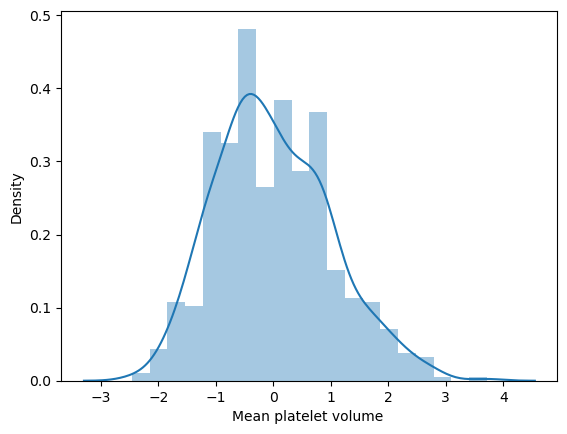

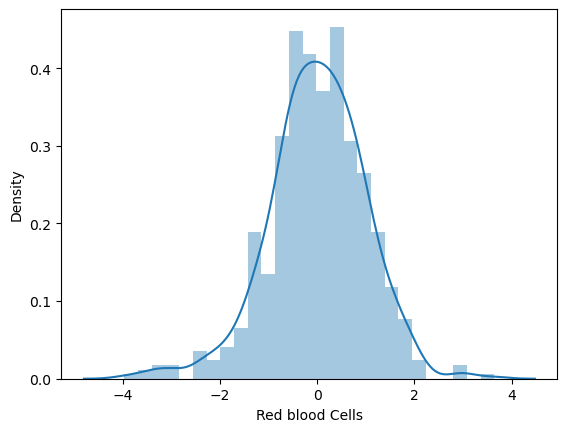

...

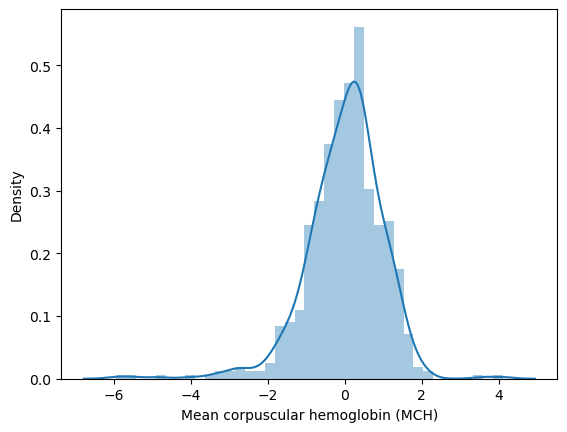

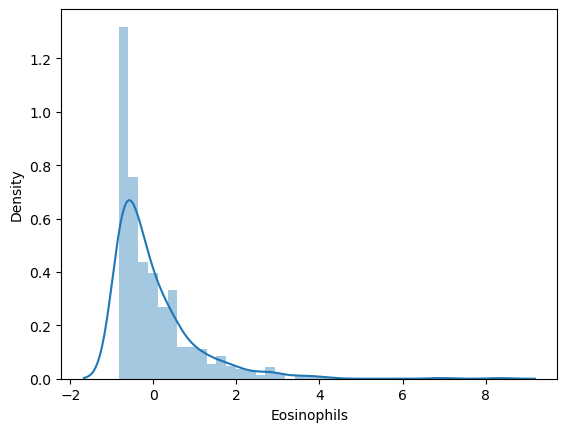

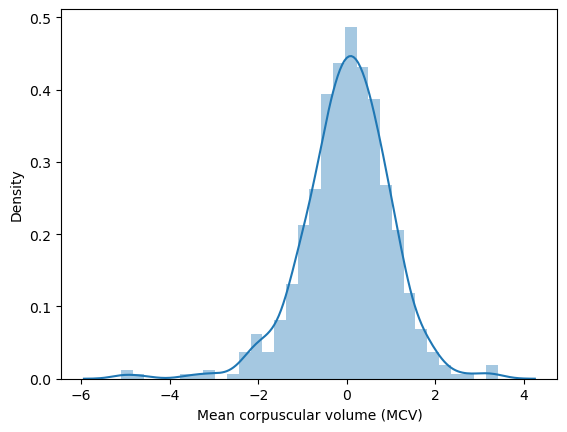

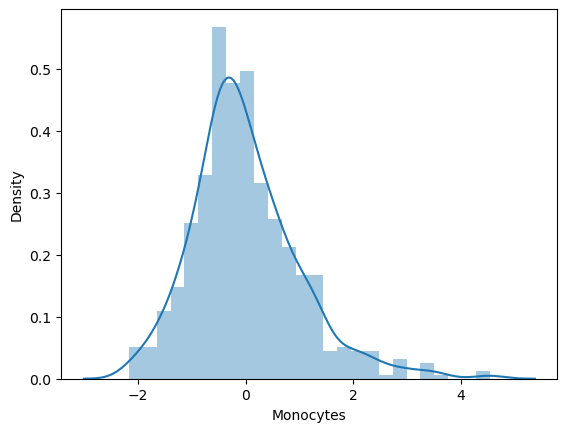

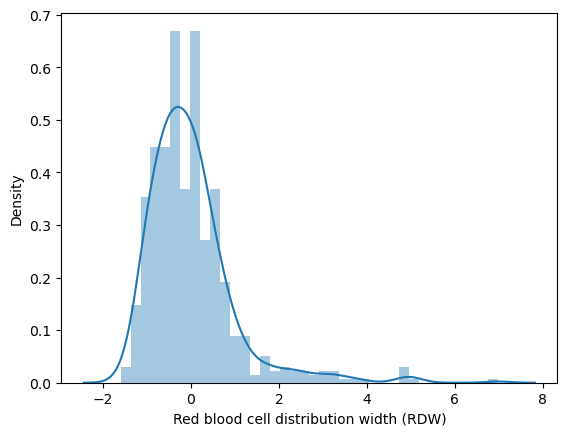

In [22]:
for col in df.select_dtypes('float'):
    plt.figure()
    sns.distplot(df[col])

<Axes: xlabel='Patient age quantile', ylabel='Density'>

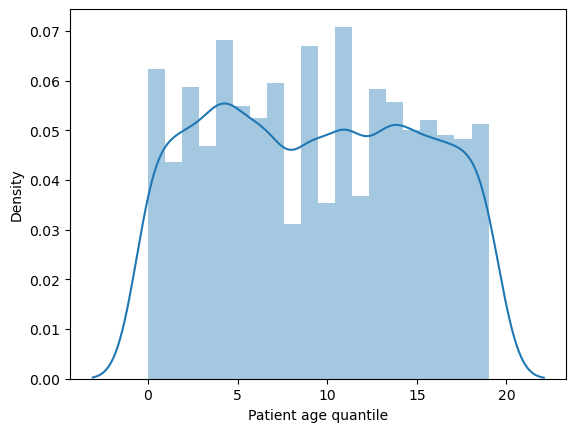

In [23]:
sns.distplot(df['Patient age quantile'], bins=20)

In [24]:
df['Patient age quantile'].value_counts()

Patient age quantile
11    380
4     366
9     359
0     334
7     319
2     315
13    313
14    299
5     294
6     281
16    279
19    275
15    269
17    263
18    259
3     251
1     234
12    197
10    190
8     167
Name: count, dtype: int64

In [25]:
for col in df.select_dtypes('object'):
    print(f'{col :-<50} {df[col].unique()}')

Patient ID---------------------------------------- ['44477f75e8169d2' '126e9dd13932f68' 'a46b4402a0e5696' ...
 '5c57d6037fe266d' 'c20c44766f28291' '2697fdccbfeb7f7']
SARS-Cov-2 exam result---------------------------- ['negative' 'positive']
Respiratory Syncytial Virus----------------------- [nan 'not_detected' 'detected']
Influenza A--------------------------------------- [nan 'not_detected' 'detected']
Influenza B--------------------------------------- [nan 'not_detected' 'detected']
Parainfluenza 1----------------------------------- [nan 'not_detected' 'detected']
CoronavirusNL63----------------------------------- [nan 'not_detected' 'detected']
Rhinovirus/Enterovirus---------------------------- [nan 'detected' 'not_detected']
Coronavirus HKU1---------------------------------- [nan 'not_detected' 'detected']
Parainfluenza 3----------------------------------- [nan 'not_detected' 'detected']
Chlamydophila pneumoniae-------------------------- [nan 'not_detected' 'detected']
Adenovirus--

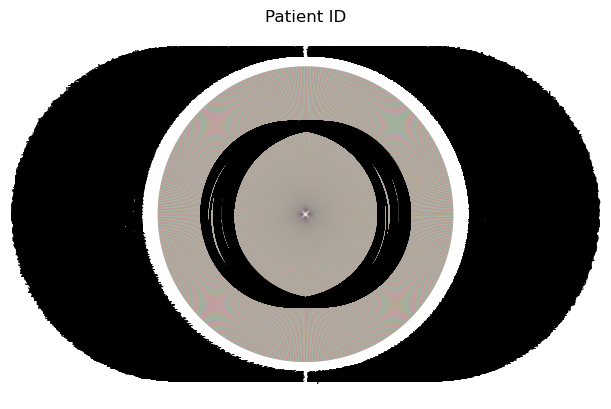

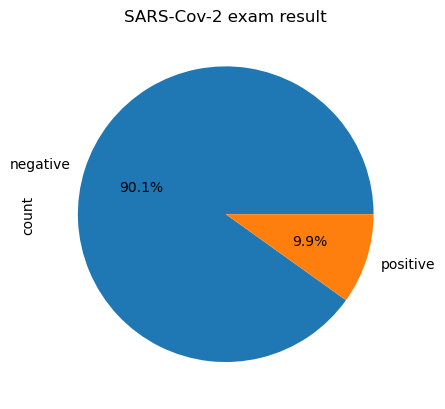

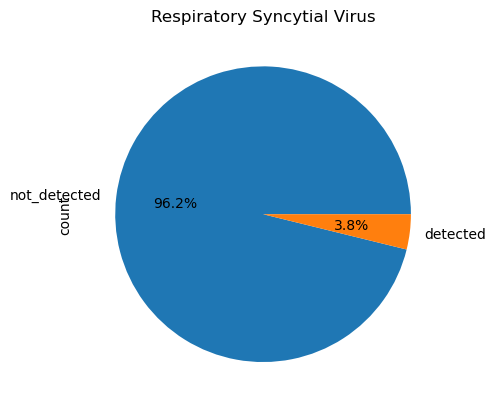

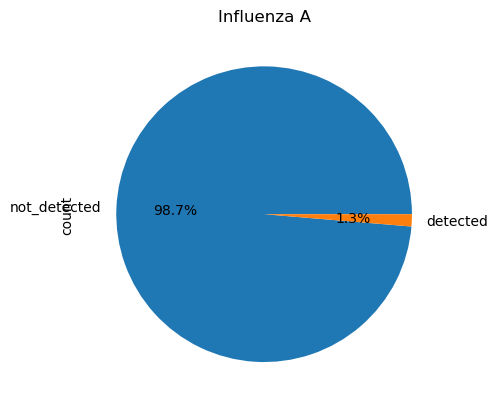

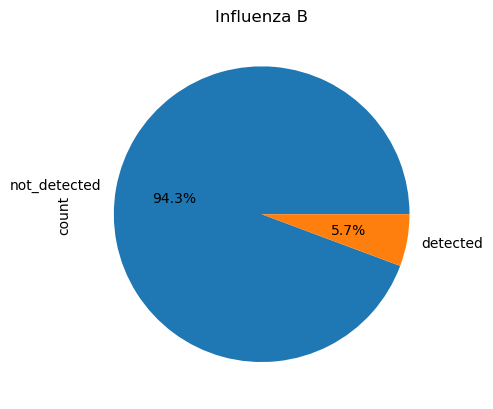

...

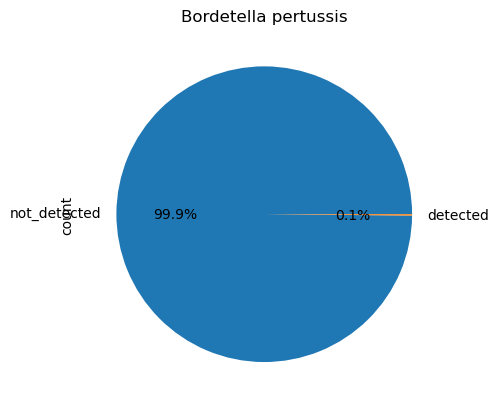

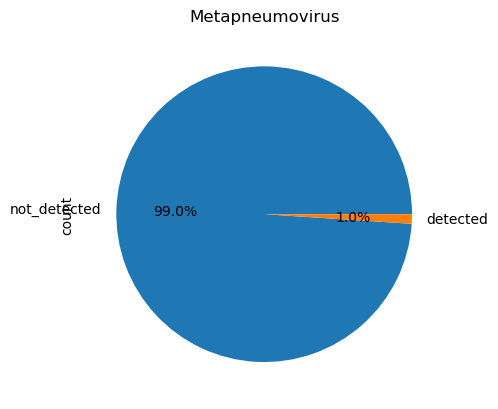

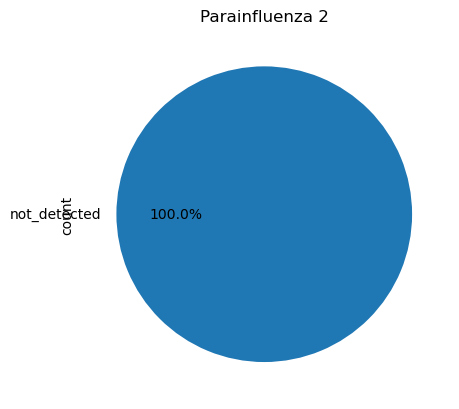

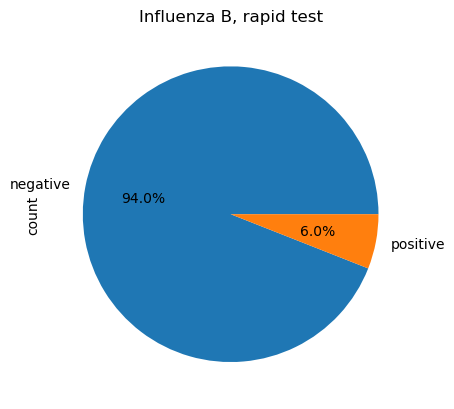

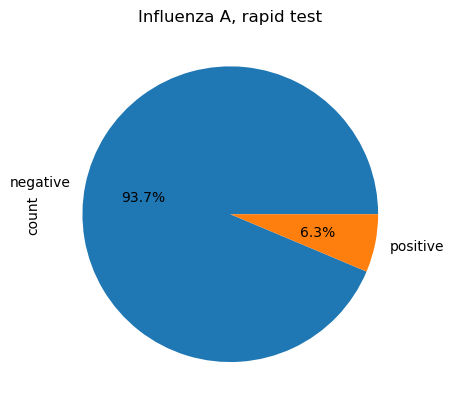

In [26]:
for col in df.select_dtypes('object'):
    plt.figure()
    df[col].value_counts().plot.pie(autopct='%1.1f%%')  
    plt.title(col)
    plt.show()   
    plt.close()  


In [27]:
positive_df = df[df['SARS-Cov-2 exam result'] == 'positive']

In [28]:
negative_df = df[df['SARS-Cov-2 exam result'] == 'negative']

In [29]:
missing_rate = df.isna().sum()/df.shape[0]

In [30]:
blood_columns = df.columns[(missing_rate < 0.9) & (missing_rate >0.88)]

In [31]:
viral_columns = df.columns[(missing_rate < 0.88) & (missing_rate > 0.75)]

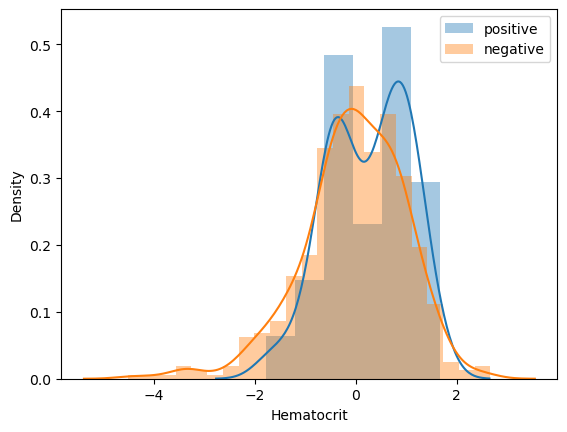

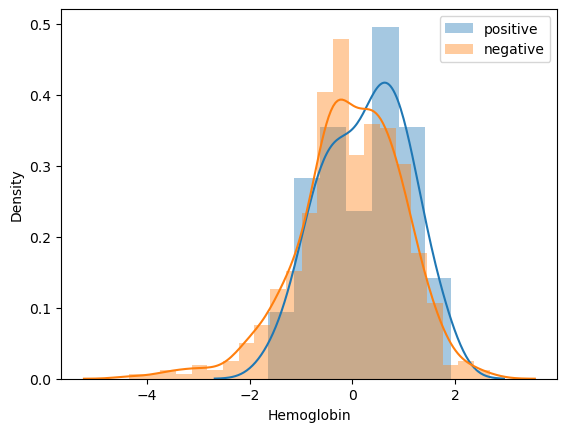

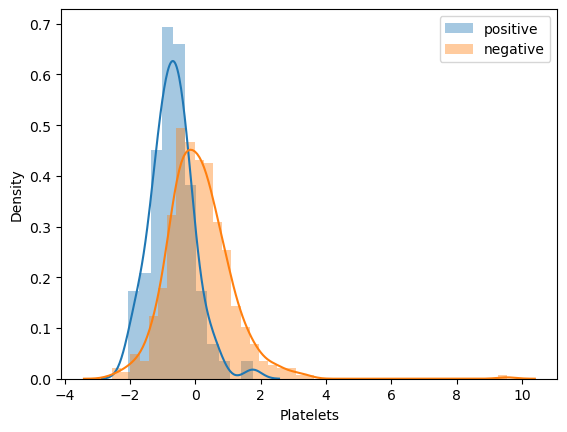

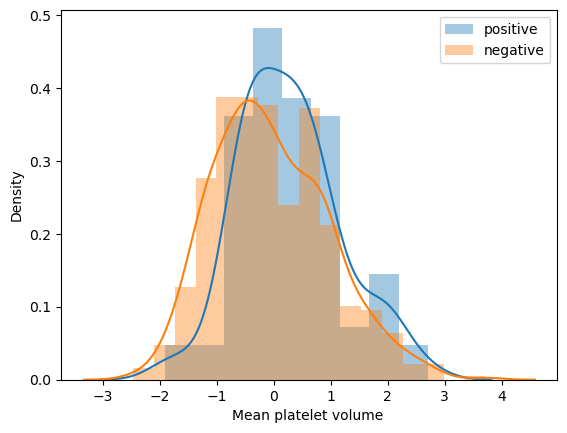

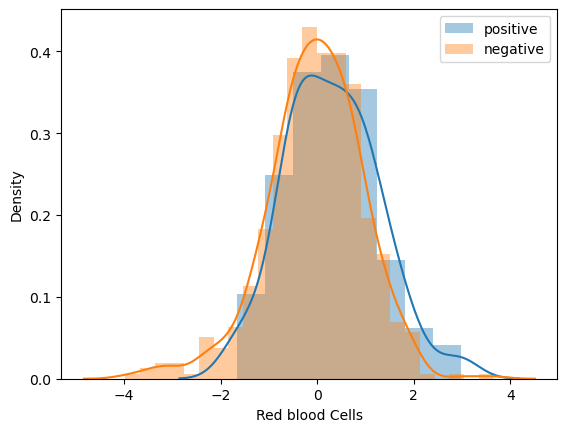

...

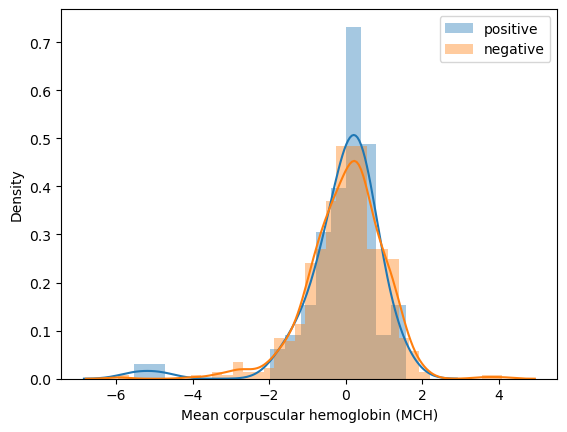

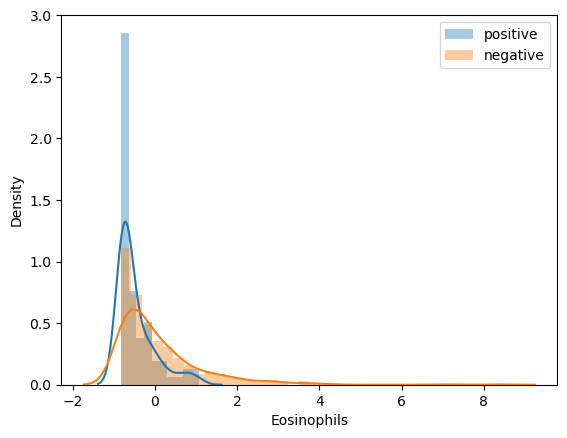

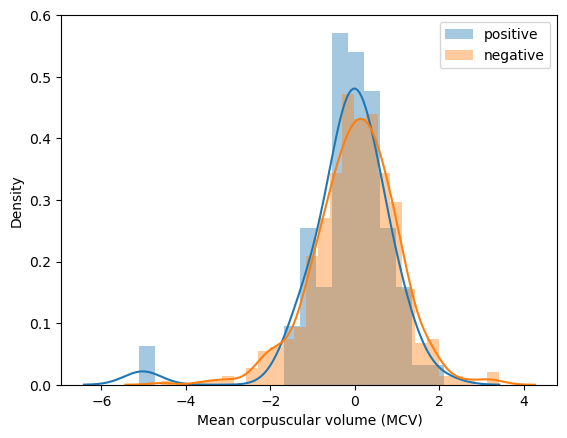

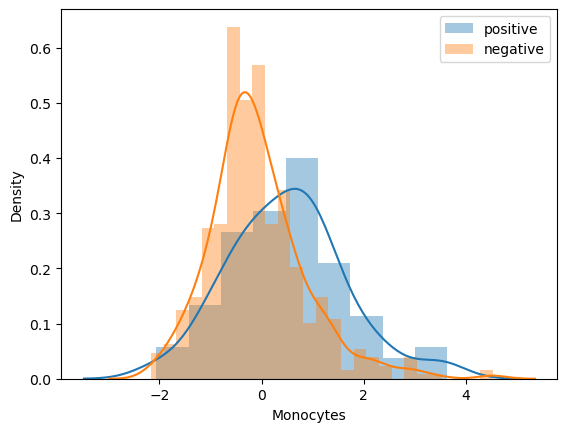

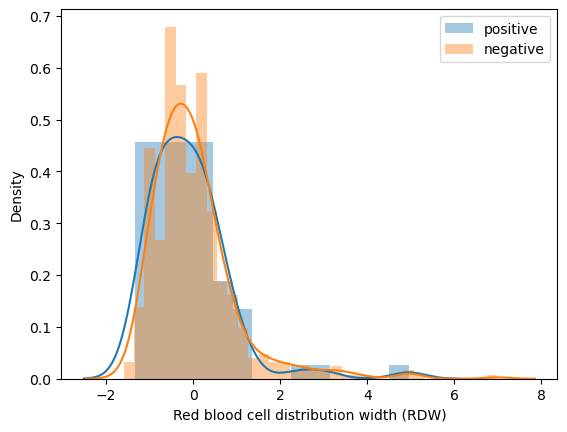

In [32]:
for col in blood_columns:
    plt.figure()
    sns.distplot(positive_df[col], label='positive')
    sns.distplot(negative_df[col], label='negative')
    plt.legend()

<Axes: xlabel='Patient age quantile', ylabel='count'>

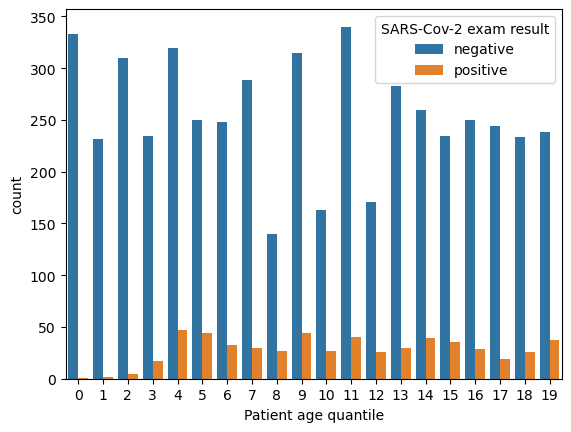

In [33]:
sns.countplot(x='Patient age quantile', hue='SARS-Cov-2 exam result', data=df)

In [34]:
pd.crosstab(df['SARS-Cov-2 exam result'], df['Influenza A'])

Influenza A,detected,not_detected
SARS-Cov-2 exam result,,
negative,18,1224
positive,0,112


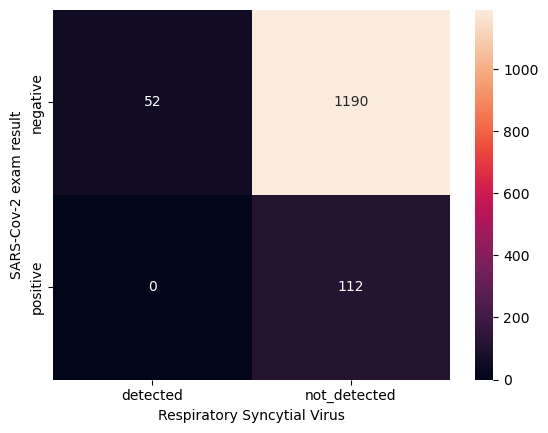

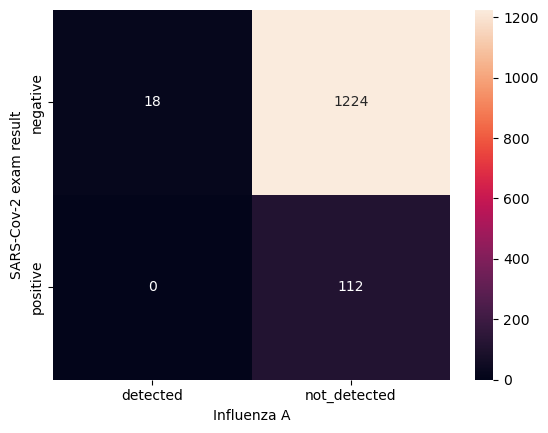

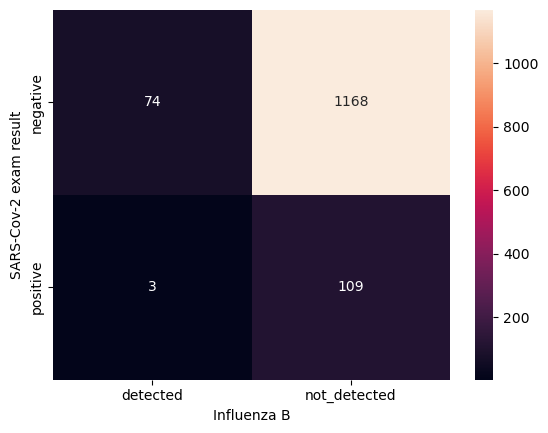

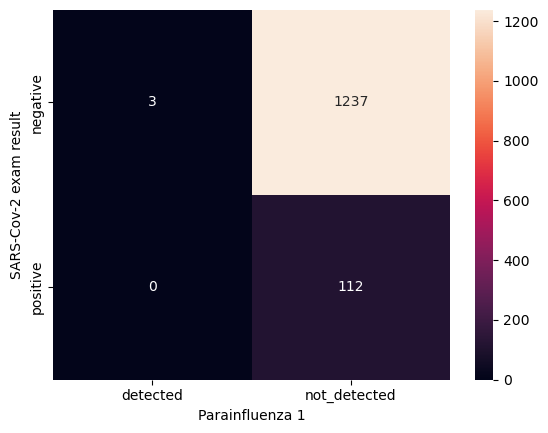

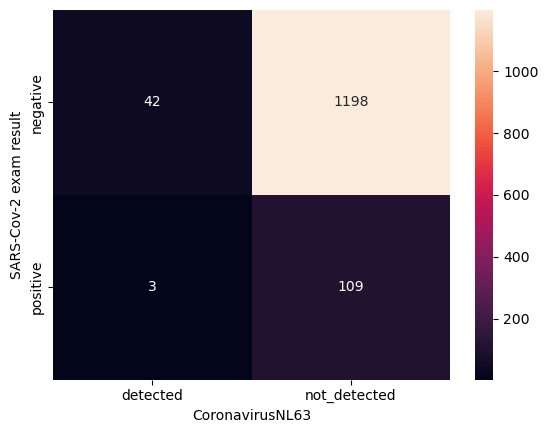

...

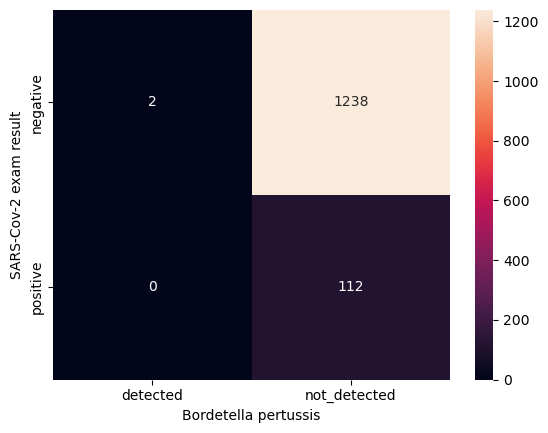

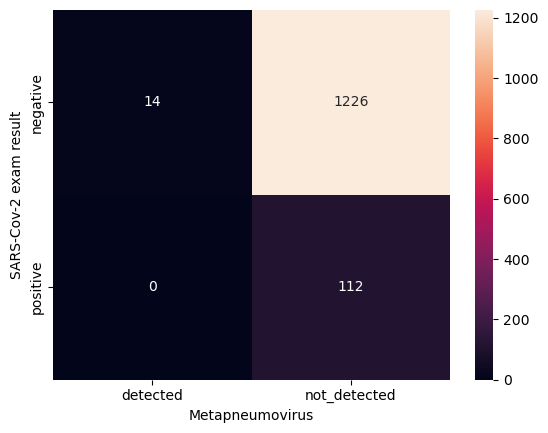

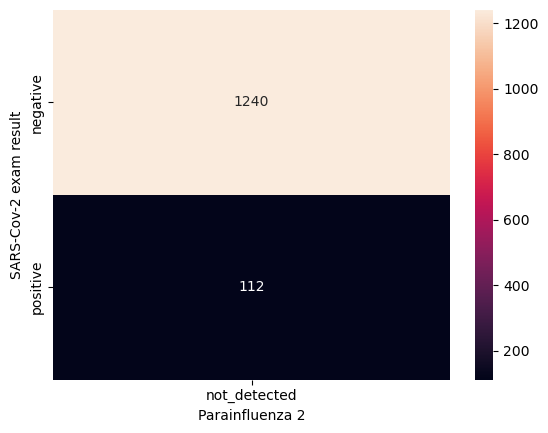

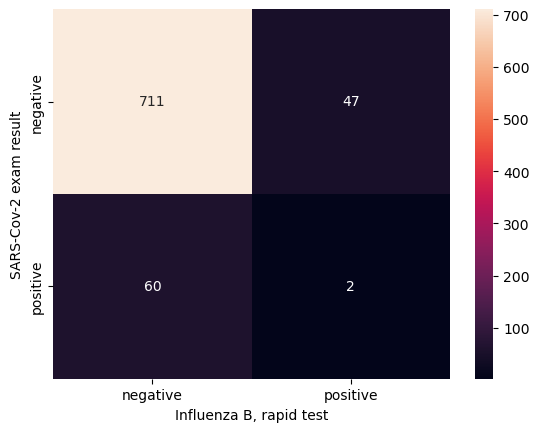

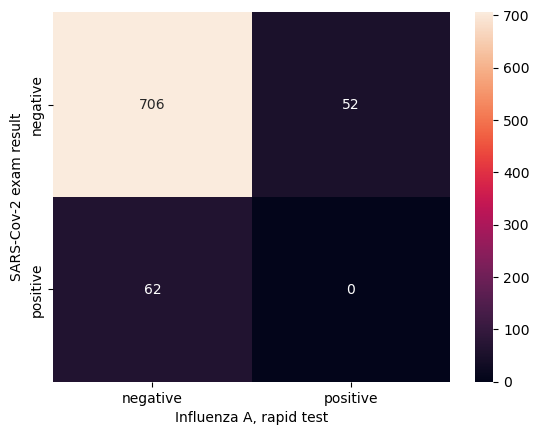

In [35]:
for col in viral_columns:
    plt.figure()
    sns.heatmap(pd.crosstab(df['SARS-Cov-2 exam result'], df[col]), annot=True, fmt='d')

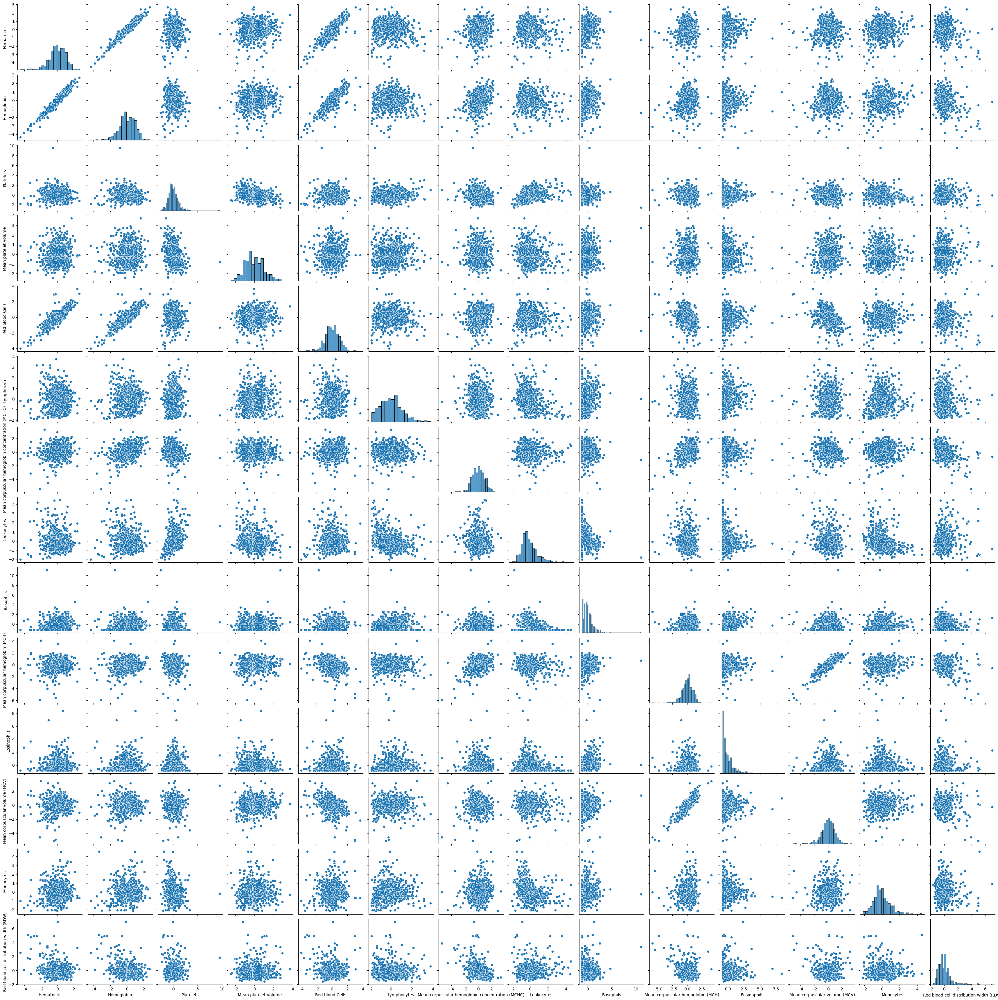

In [36]:
sns.pairplot(df[blood_columns])

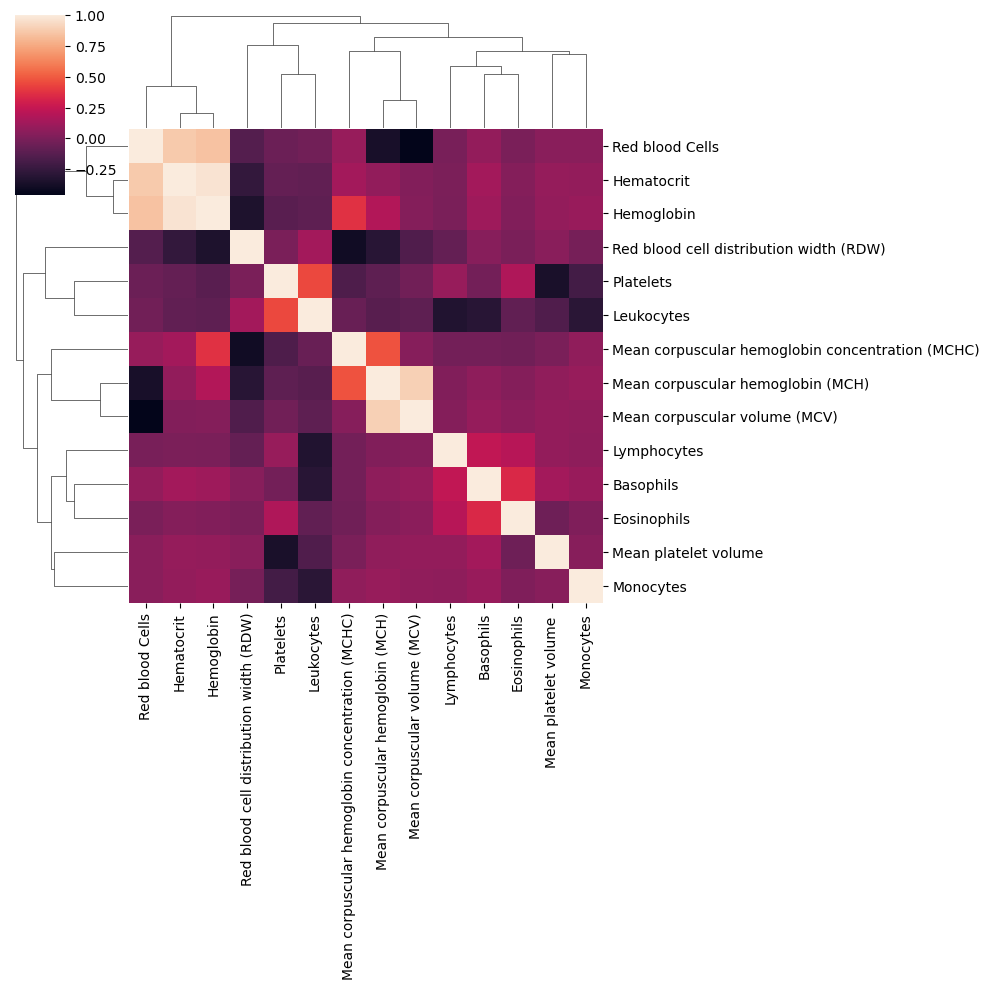

In [37]:
sns.clustermap(df[blood_columns].corr())

C:\Users\lenovo\AppData\Local\Temp\ipykernel_21124\695644951.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


<Figure size 640x480 with 0 Axes>

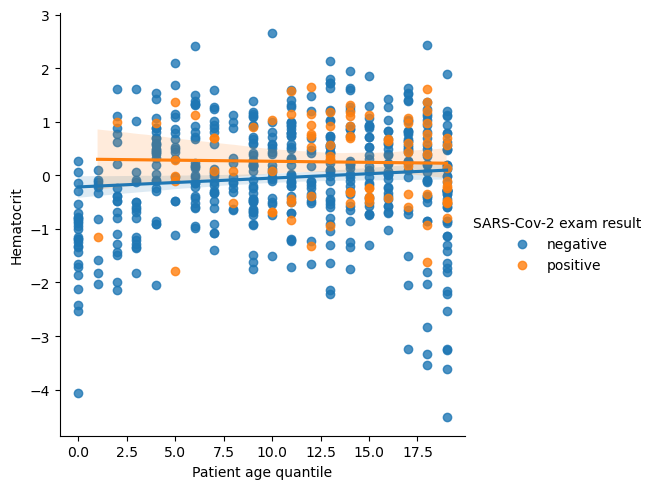

<Figure size 640x480 with 0 Axes>

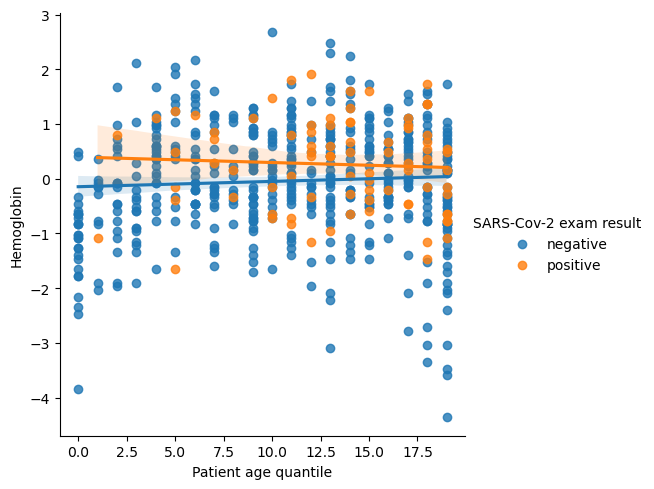

<Figure size 640x480 with 0 Axes>

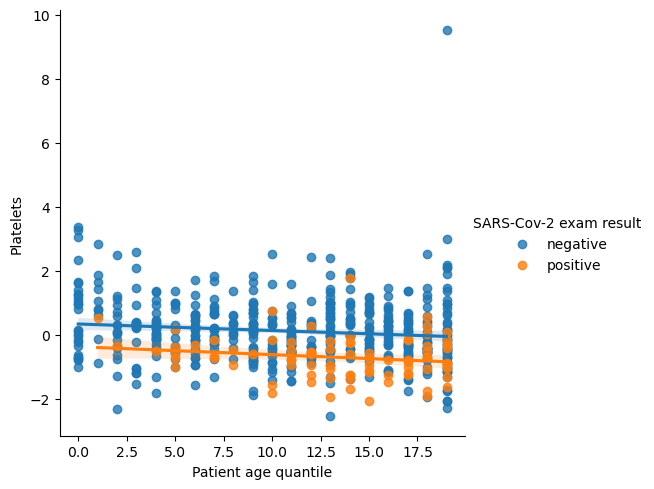

<Figure size 640x480 with 0 Axes>

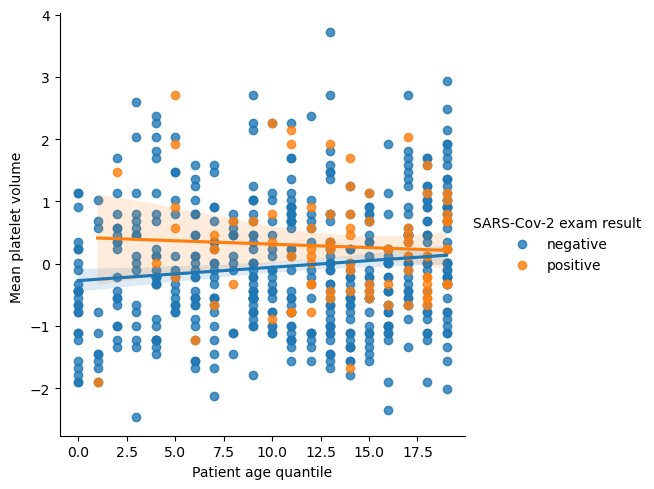

<Figure size 640x480 with 0 Axes>

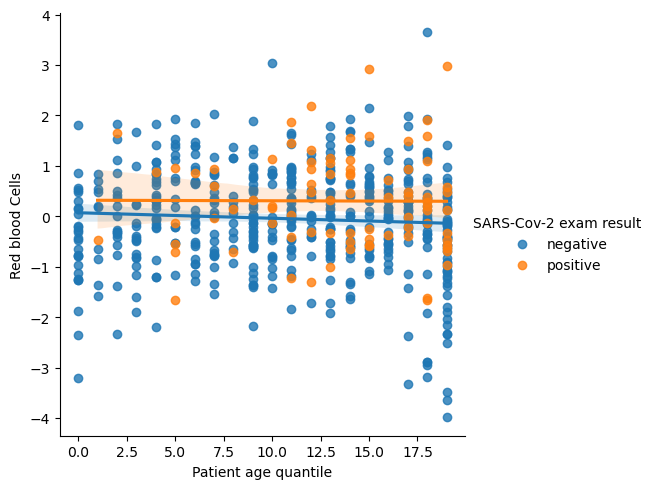

<Figure size 640x480 with 0 Axes>

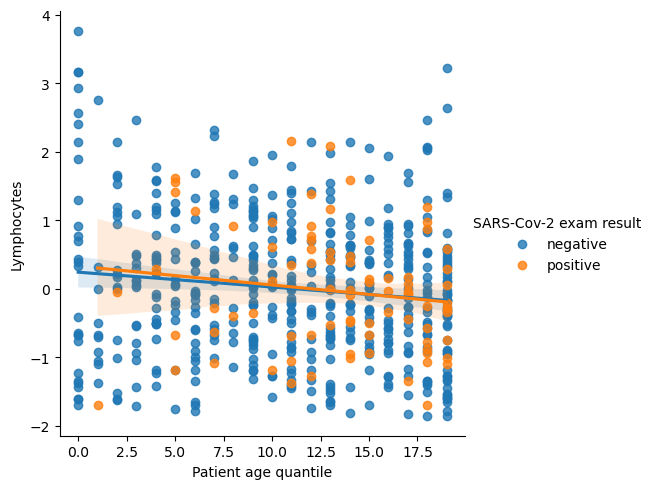

<Figure size 640x480 with 0 Axes>

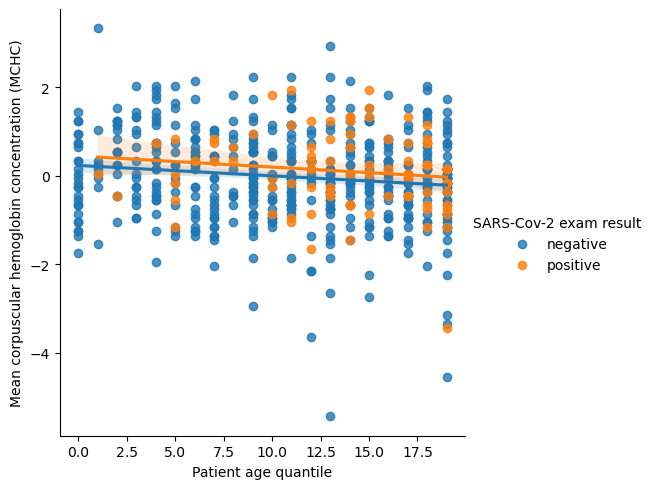

<Figure size 640x480 with 0 Axes>

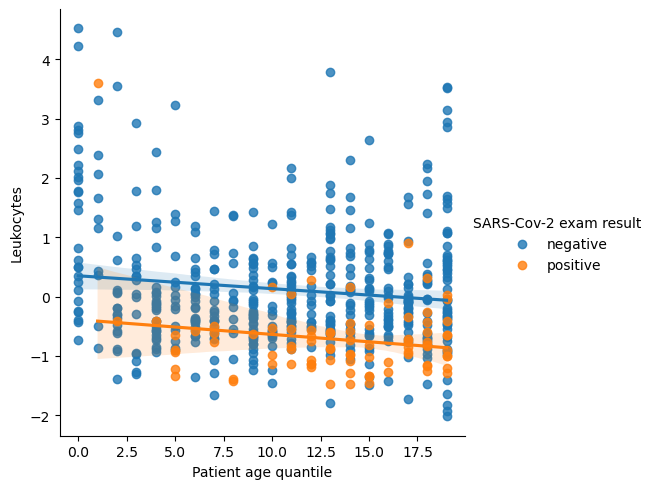

<Figure size 640x480 with 0 Axes>

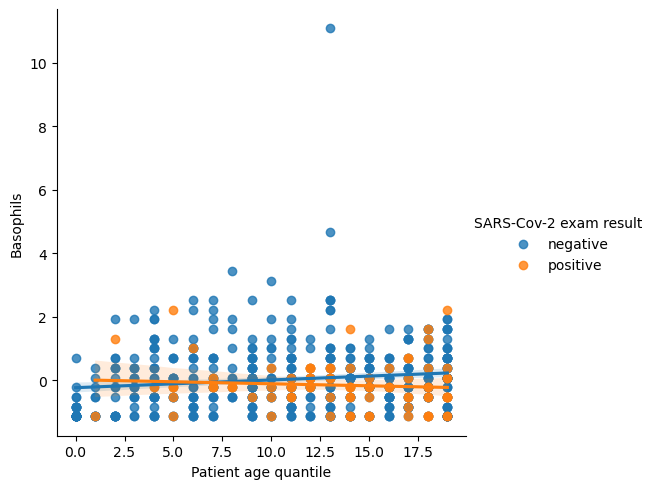

<Figure size 640x480 with 0 Axes>

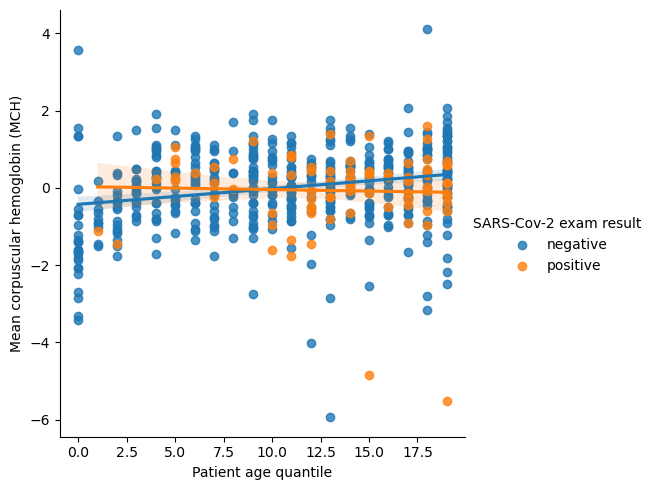

<Figure size 640x480 with 0 Axes>

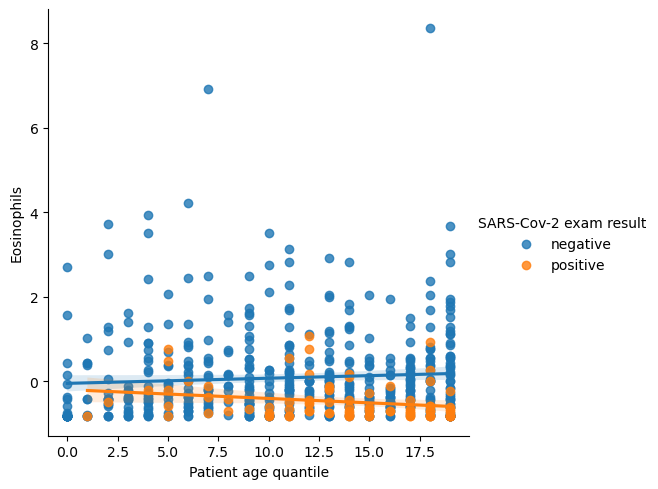

<Figure size 640x480 with 0 Axes>

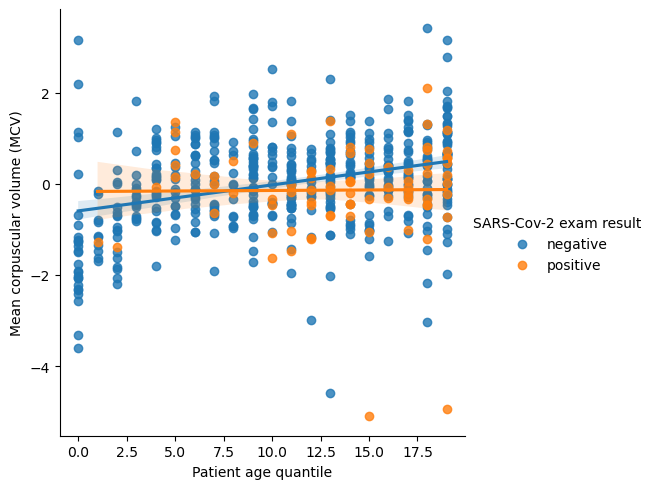

<Figure size 640x480 with 0 Axes>

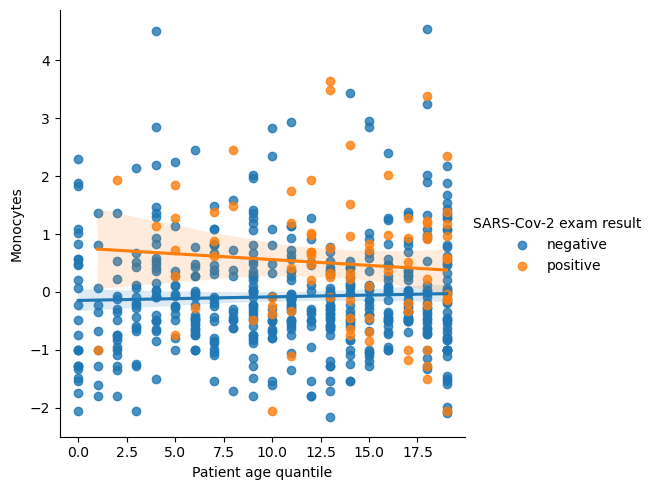

<Figure size 640x480 with 0 Axes>

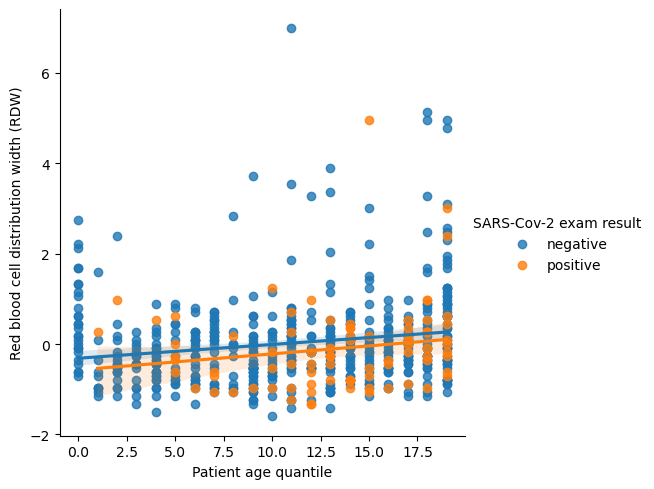

In [38]:
for col in blood_columns:
    plt.figure()
    sns.lmplot(x='Patient age quantile', y=col, hue='SARS-Cov-2 exam result', data=df)

In [39]:
df_numeric = df.select_dtypes(include=['number'])
df_numeric.corr()['Patient age quantile'].sort_values()

Leukocytes                                              -0.166386
Platelets                                               -0.158683
Lymphocytes                                             -0.125935
Mean corpuscular hemoglobin concentration (MCHC)        -0.124671
Red blood Cells                                         -0.037510
Patient addmited to intensive care unit (1=yes, 0=no)   -0.035772
Patient addmited to semi-intensive unit (1=yes, 0=no)    0.015736
Eosinophils                                              0.022085
Patient addmited to regular ward (1=yes, 0=no)           0.046166
Monocytes                                                0.050962
Hemoglobin                                               0.060320
Hematocrit                                               0.096808
Basophils                                                0.107525
Mean platelet volume                                     0.119449
Red blood cell distribution width (RDW)                  0.166429
Mean corpu

In [40]:
pd.crosstab(df['Influenza A'], df['Influenza A, rapid test'])

"Influenza A, rapid test",negative,positive
Influenza A,,
detected,2,4
not_detected,245,15


In [41]:
pd.crosstab(df['Influenza B'], df['Influenza B, rapid test'])

"Influenza B, rapid test",negative,positive
Influenza B,,
detected,18,11
not_detected,233,4


In [42]:
df['est malade'] = np.sum(df[viral_columns[:-2]] == 'detected', axis=1) >=1

In [43]:
df.head()

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test",est malade
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
1,126e9dd13932f68,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,0.102004,0.318366,-0.95079,-0.09461,-0.223767,-0.292269,1.482158,0.166192,0.357547,-0.625073,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative,True
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
3,f7d619a94f97c45,5,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
4,d9e41465789c2b5,15,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN,True


In [44]:
malade_df = df[df['est malade'] == True]
non_malade_df = df[df['est malade'] == False]

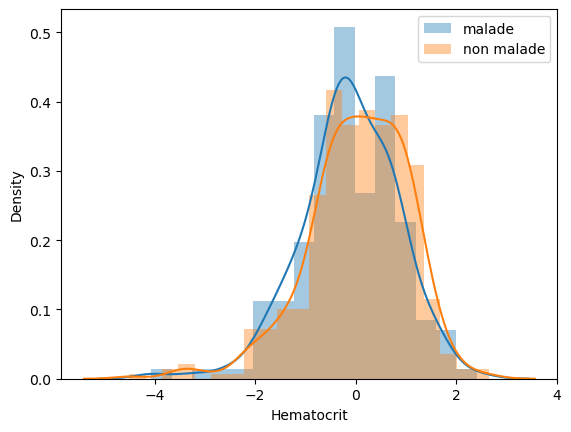

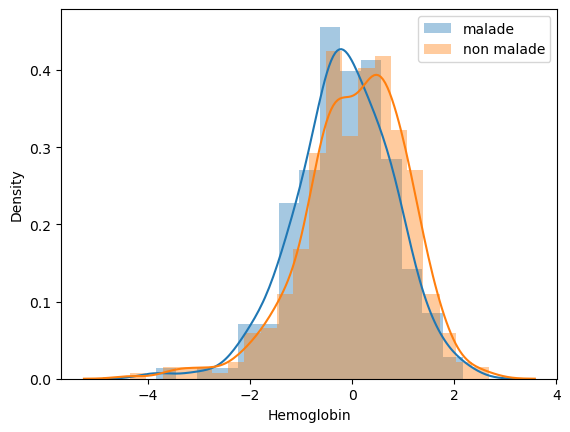

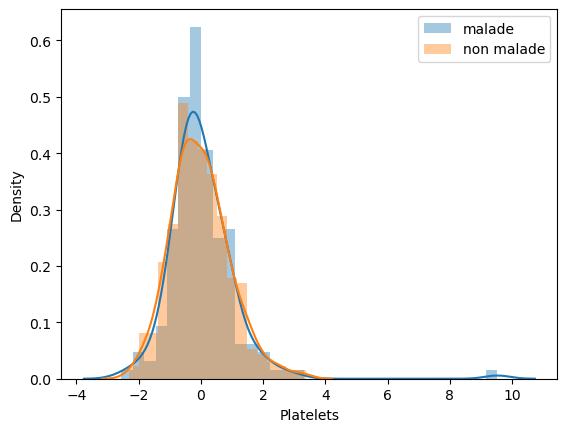

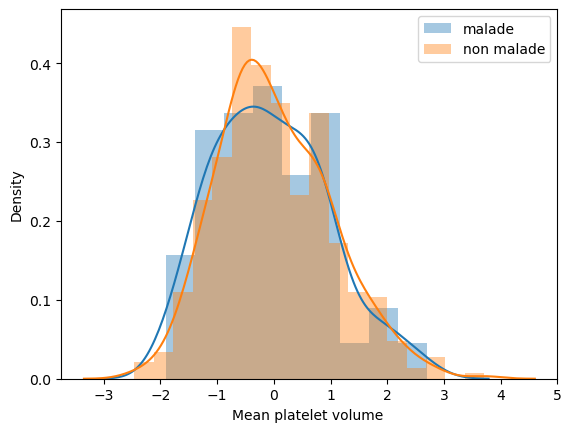

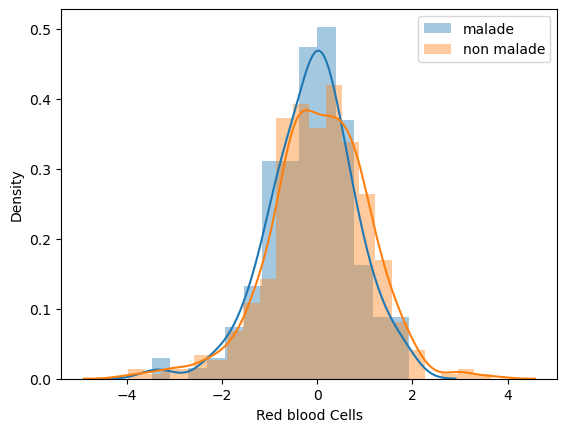

...

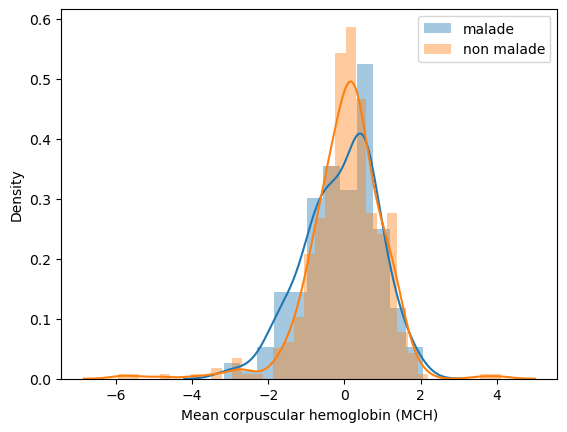

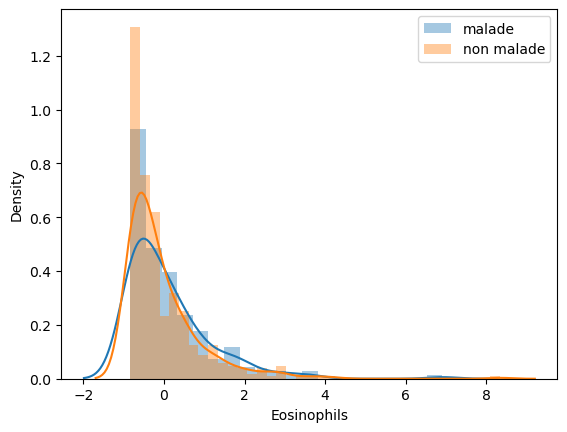

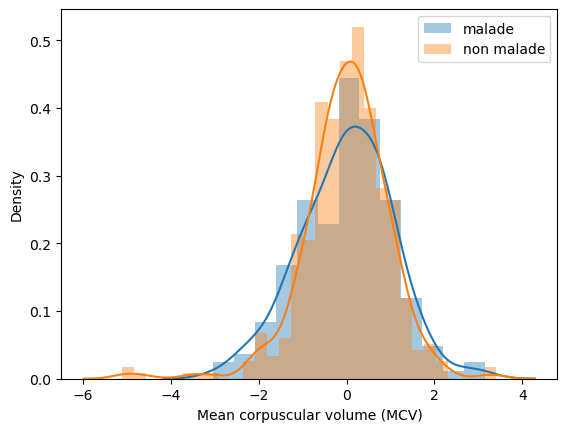

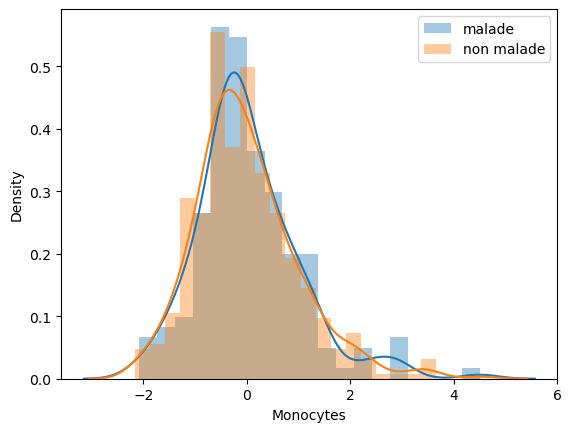

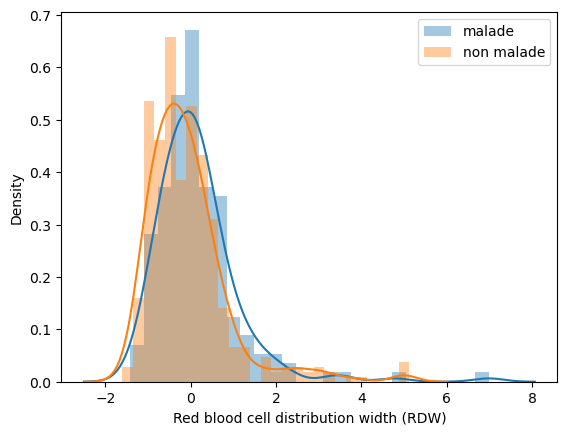

In [45]:
for col in blood_columns:
    plt.figure()
    sns.distplot(malade_df[col], label='malade')
    sns.distplot(non_malade_df[col], label='non malade')
    plt.legend()

In [46]:
def hospitalisation(df):
    if df['Patient addmited to regular ward (1=yes, 0=no)'] == 1:
        return 'surveillance'
    elif df['Patient addmited to semi-intensive unit (1=yes, 0=no)'] == 1:
        return 'soins semi-intensives'
    elif df['Patient addmited to intensive care unit (1=yes, 0=no)'] == 1:
        return 'soins intensifs'
    else:
        return 'inconnu'

In [47]:
df['statut'] = df.apply(hospitalisation, axis=1)

In [48]:
df.head()

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test",est malade,statut
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,inconnu
1,126e9dd13932f68,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,0.102004,0.318366,-0.95079,-0.09461,-0.223767,-0.292269,1.482158,0.166192,0.357547,-0.625073,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative,True,inconnu
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,inconnu
3,f7d619a94f97c45,5,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,inconnu
4,d9e41465789c2b5,15,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN,True,inconnu


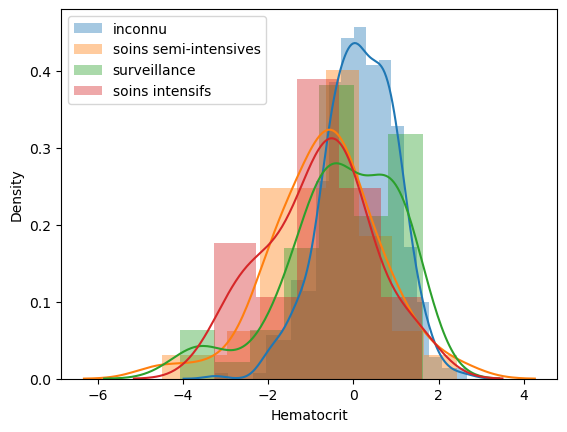

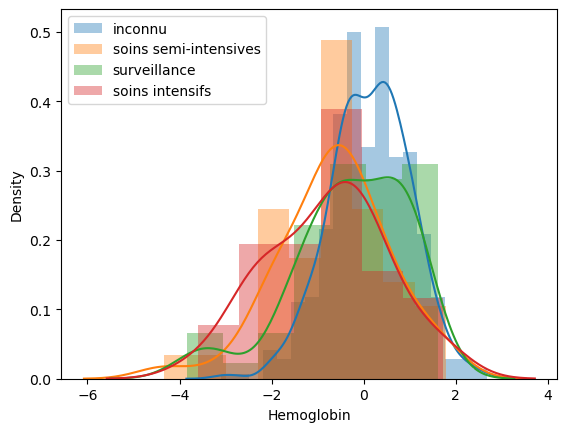

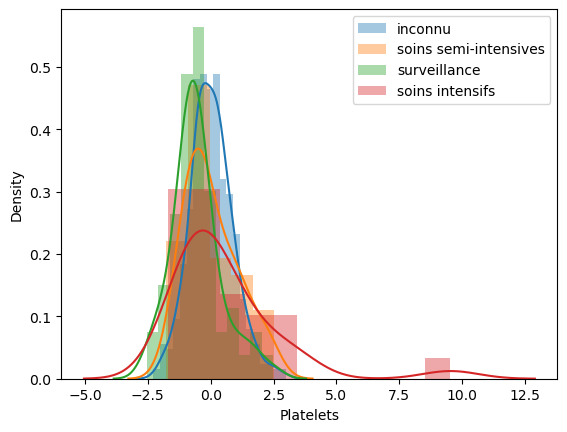

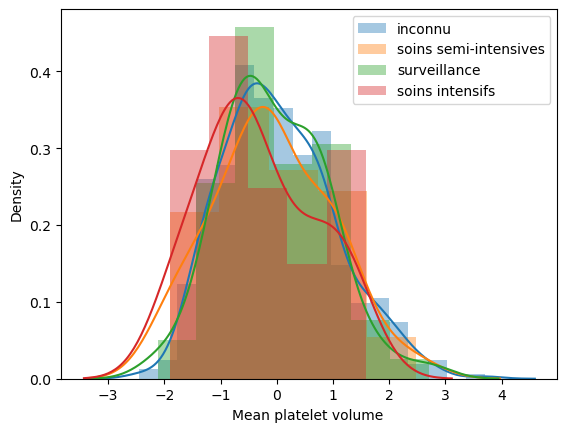

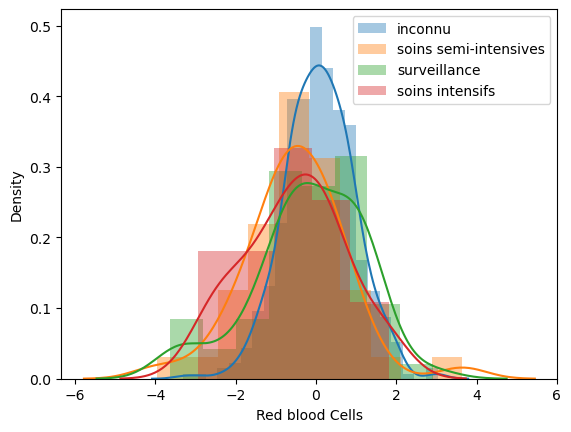

...

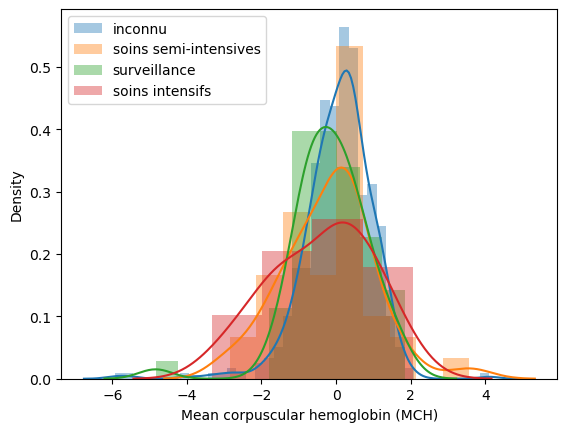

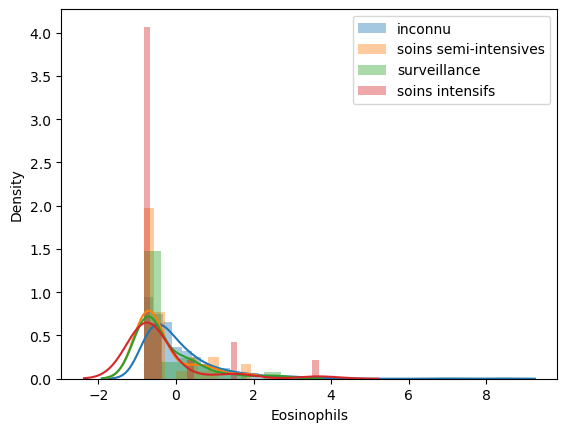

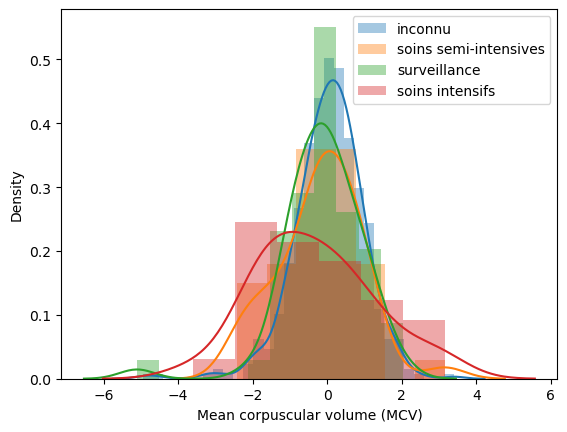

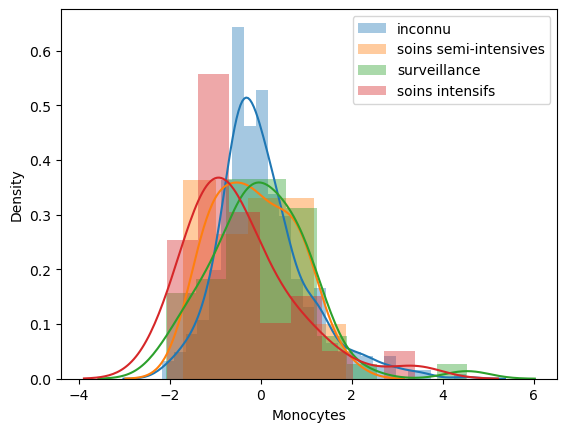

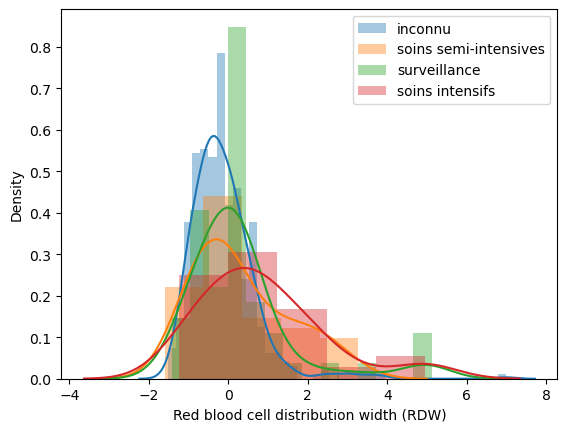

In [49]:
for col in blood_columns:
    plt.figure()
    for cat in df['statut'].unique():
        sns.distplot(df[df['statut']==cat][col], label=cat)
    plt.legend()

In [50]:
df[blood_columns].count()

Hematocrit                                          603
Hemoglobin                                          603
Platelets                                           602
Mean platelet volume                                599
Red blood Cells                                     602
Lymphocytes                                         602
Mean corpuscular hemoglobin concentration (MCHC)    602
Leukocytes                                          602
Basophils                                           602
Mean corpuscular hemoglobin (MCH)                   602
Eosinophils                                         602
Mean corpuscular volume (MCV)                       602
Monocytes                                           601
Red blood cell distribution width (RDW)             602
dtype: int64

In [51]:
df[viral_columns].count()

Respiratory Syncytial Virus    1354
Influenza A                    1354
Influenza B                    1354
Parainfluenza 1                1352
CoronavirusNL63                1352
Rhinovirus/Enterovirus         1352
Coronavirus HKU1               1352
Parainfluenza 3                1352
Chlamydophila pneumoniae       1352
Adenovirus                     1352
Parainfluenza 4                1352
Coronavirus229E                1352
CoronavirusOC43                1352
Inf A H1N1 2009                1352
Bordetella pertussis           1352
Metapneumovirus                1352
Parainfluenza 2                1352
Influenza B, rapid test         820
Influenza A, rapid test         820
dtype: int64

In [52]:
df1 = df[viral_columns[:-2]]
df1['covid'] = df['SARS-Cov-2 exam result']
df1.dropna()['covid'].value_counts(normalize=True)

C:\Users\lenovo\AppData\Local\Temp\ipykernel_21124\3520532109.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['covid'] = df['SARS-Cov-2 exam result']


covid
negative    0.91716
positive    0.08284
Name: proportion, dtype: float64

In [53]:
df2 = df[blood_columns]
df2['covid'] = df['SARS-Cov-2 exam result']
df2.dropna()['covid'].value_counts(normalize=True)

C:\Users\lenovo\AppData\Local\Temp\ipykernel_21124\4103850288.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['covid'] = df['SARS-Cov-2 exam result']


covid
negative    0.864548
positive    0.135452
Name: proportion, dtype: float64

In [54]:
from scipy.stats import ttest_ind

In [55]:
positive_df

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
67,78511c183ae18bc,7,positive,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
284,d7834ed75f2da44,16,positive,1,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
513,b16b49f7bd3e692,10,positive,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
568,4382f5ea05e60c4,2,positive,0,0,0,0.991838,0.792188,-0.341548,1.469188,1.653476,-0.048383,-0.452899,-0.420197,1.303529,-1.442245,-0.498393,-1.396114,1.933339,0.967144,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
676,d3729cd2658ca64,15,positive,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5632,5c386388ba3c3f0,16,positive,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5633,9f8dfe2ae239238,4,positive,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5634,db77903261ab6d0,15,positive,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5639,ae66feb9e4dc3a0,3,positive,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [56]:
balanced_neg = negative_df.sample(positive_df.shape[0])

In [57]:
def t_test(col):
    alpha = 0.02
    stat, p = ttest_ind(balanced_neg[col].dropna(), positive_df[col].dropna())
    if p < alpha:
        return 'H0 Rejetée'
    else :
        return 0

In [58]:
for col in blood_columns:
    print(f'{col :-<50} {t_test(col)}')

Hematocrit---------------------------------------- 0
Hemoglobin---------------------------------------- 0
Platelets----------------------------------------- H0 Rejetée
Mean platelet volume ----------------------------- 0
Red blood Cells----------------------------------- 0
Lymphocytes--------------------------------------- 0
Mean corpuscular hemoglobin concentration (MCHC)-- 0
Leukocytes---------------------------------------- H0 Rejetée
Basophils----------------------------------------- 0
Mean corpuscular hemoglobin (MCH)----------------- 0
Eosinophils--------------------------------------- H0 Rejetée
Mean corpuscular volume (MCV)--------------------- 0
Monocytes----------------------------------------- H0 Rejetée
Red blood cell distribution width (RDW)----------- 0


In [59]:
df = data.copy()
df.head()

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Serum Glucose,Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Mycoplasma pneumoniae,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,Neutrophils,Urea,Proteina C reativa mg/dL,Creatinine,Potassium,Sodium,"Influenza B, rapid test","Influenza A, rapid test",Alanine transaminase,Aspartate transaminase,Gamma-glutamyltransferase,Total Bilirubin,Direct Bilirubin,Indirect Bilirubin,Alkaline phosphatase,Ionized calcium,Strepto A,Magnesium,pCO2 (venous blood gas analysis),Hb saturation (venous blood gas analysis),Base excess (venous blood gas analysis),pO2 (venous blood gas analysis),Fio2 (venous blood gas analysis),Total CO2 (venous blood gas analysis),pH (venous blood gas analysis),HCO3 (venous blood gas analysis),Rods #,Segmented,Promyelocytes,Metamyelocytes,Myelocytes,Myeloblasts,Urine - Esterase,Urine - Aspect,Urine - pH,Urine - Hemoglobin,Urine - Bile pigments,Urine - Ketone Bodies,Urine - Nitrite,Urine - Density,Urine - Urobilinogen,Urine - Protein,Urine - Sugar,Urine - Leukocytes,Urine - Crystals,Urine - Red blood cells,Urine - Hyaline cylinders,Urine - Granular cylinders,Urine - Yeasts,Urine - Color,Partial thromboplastin time (PTT),Relationship (Patient/Normal),International normalized ratio (INR),Lactic Dehydrogenase,"Prothrombin time (PT), Activity",Vitamin B12,Creatine phosphokinase (CPK),Ferritin,Arterial Lactic Acid,Lipase dosage,D-Dimer,Albumin,Hb saturation (arterial blood gases),pCO2 (arterial blood gas analysis),Base excess (arterial blood gas analysis),pH (arterial blood gas analysis),Total CO2 (arterial blood gas analysis),HCO3 (arterial blood gas analysis),pO2 (arterial blood gas analysis),Arteiral Fio2,Phosphor,ctO2 (arterial blood gas analysis)
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,0.102004,0.318366,-0.95079,-0.09461,-0.223767,-0.292269,1.482158,0.166192,0.357547,-0.625073,-0.140648,not_detected,not_detected,not_detected,not_detected,not_detected,detected,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,-0.619086,1.198059,-0.147895,2.089928,-0.305787,0.862512,negative,negative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

 -  # <font color = bleu> **Prétraitement des Données (Data Preprocessing)** :</span>

# Prétraitement des Données (Data Preprocessing)

## 🎯 Objectif

L’objectif du prétraitement est de transformer un jeu de données médicales brut, fortement incomplet et hétérogène, en un ensemble de données exploitable pour l’apprentissage automatique, tout en limitant la perte d’information et les biais statistiques susceptibles d’altérer les performances des modèles.

---

## 📌 Sélection des variables pertinentes

Le jeu de données initial comporte un nombre élevé de variables, dont une grande partie présente des taux importants de valeurs manquantes. Une analyse exploratoire du taux de complétude par variable a permis d’identifier deux grandes familles d’attributs exploitables :

- **Variables biologiques (tests sanguins)**  
  Taux de valeurs manquantes compris entre **88 % et 90 %**

- **Variables virologiques (tests viraux)**  
  Taux de valeurs manquantes compris entre **75 % et 80 %**

En complément, les variables clés suivantes ont été conservées :

- **Patient age quantile**
- **SARS-Cov-2 exam result** *(variable cible)*

Ce filtrage permet de **réduire la dimensionnalité du jeu de données** tout en conservant les informations cliniquement pertinentes pour le diagnostic.

---

## ✂️ Découpage apprentissage / test

Les données ont été séparées en deux ensembles indépendants :

- **80 %** des données pour l’apprentissage (training set)
- **20 %** des données pour le test (test set)

La distribution des classes met en évidence un **déséquilibre important** :

- Environ **90 %** de patients négatifs
- Environ **10 %** de patients positifs

Ce déséquilibre est volontairement conservé dans les deux ensembles afin de **reproduire une situation clinique réaliste**.

---

## 🔢 Encodage des variables catégorielles

Les variables qualitatives ont été transformées en variables numériques à l’aide d’un encodage binaire cohérent :

- `negative`, `not_detected` → **0**
- `positive`, `detected` → **1**

Cet encodage homogène permet l’utilisation directe des algorithmes de machine learning sans ambiguïté d’interprétation.

---

## 🧪 Feature Engineering

Une variable synthétique a été créée afin de condenser l’information virologique :

- **est_malade** : indique si au moins un test viral est positif

Cette variable permet de :
- Résumer l’information issue de plusieurs tests viraux
- Réduire la redondance entre les variables
- Simplifier la modélisation

Les tests viraux individuels ont ensuite été supprimés.

---

## 🚫 Gestion des valeurs manquantes

Compte tenu du taux extrêmement élevé de valeurs manquantes et afin d’éviter l’introduction de biais artificiels, une stratégie volontairement stricte a été adoptée :

- **Suppression des lignes contenant des valeurs manquantes**

Bien que cette approche réduise la taille du jeu de données, elle garantit une **meilleure fiabilité statistique** et une interprétation plus robuste des résultats de modélisation.

---

# Évaluation des Modèles de Machine Learning

## 📊 Méthodologie d’évaluation

Afin d’évaluer rigoureusement les performances des modèles de classification développés pour le diagnostic du COVID-19, une procédure d’évaluation standard et robuste a été mise en place.

Chaque modèle est entraîné sur l’ensemble d’apprentissage, puis évalué sur un ensemble de test indépendant. Cette approche permet d’estimer la **capacité de généralisation** du modèle sur des données jamais vues.

---

## 🧮 Indicateurs de performance

Les performances sont analysées à l’aide de plusieurs métriques complémentaires :

- **Matrice de confusion**  
  Permet d’identifier les vrais positifs, faux positifs, vrais négatifs et faux négatifs. Cet outil est particulièrement crucial dans un contexte médical, où les erreurs de classification peuvent avoir des conséquences cliniques importantes.

- **Rapport de classification (classification report)**  
  Fournit les métriques suivantes pour chaque classe :
  - Précision (*precision*)
  - Rappel (*recall*)
  - Score F1 (*F1-score*)

Le **score F1** est privilégié car il constitue un bon compromis entre précision et rappel dans un contexte de **fort déséquilibre des classes**.

---

## 📈 Courbes d’apprentissage (Learning Curves)

Des courbes d’apprentissage ont été tracées afin d’analyser le comportement des modèles en fonction de la quantité de données disponibles. Elles permettent de :

- Détecter un **surapprentissage (overfitting)** lorsque les performances sur l’entraînement sont nettement supérieures à celles sur la validation
- Identifier un **sous-apprentissage (underfitting)** lorsque les performances restent faibles sur les deux ensembles
- Évaluer si l’ajout de données supplémentaires pourrait améliorer les performances du modèle

---

## 🔁 Validation croisée

Une **validation croisée à 4 plis (4-fold cross-validation)** a été utilisée afin de :

- Réduire la variance liée à un découpage particulier des données
- Obtenir une estimation plus fiable et plus robuste des performances globales des modèles


In [60]:
missing_rate = df.isna().sum()/df.shape[0]

In [61]:
blood_columns = list(df.columns[(missing_rate < 0.9) & (missing_rate >0.88)])
viral_columns = list(df.columns[(missing_rate < 0.80) & (missing_rate > 0.75)])

In [62]:
key_columns = ['Patient age quantile', 'SARS-Cov-2 exam result']

In [63]:
df = df[key_columns + blood_columns + viral_columns]
df.head()

,Patient age quantile,SARS-Cov-2 exam result,Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2
0,13,negative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17,negative,0.236515,-0.02234,-0.517413,0.010677,0.102004,0.318366,-0.95079,-0.09461,-0.223767,-0.292269,1.482158,0.166192,0.357547,-0.625073,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected
2,8,negative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5,negative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,15,negative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected


In [64]:
from sklearn.model_selection import train_test_split

In [65]:
trainset, testset = train_test_split(df, test_size=0.2, random_state=0)

In [66]:
trainset['SARS-Cov-2 exam result'].value_counts()

SARS-Cov-2 exam result
negative    4068
positive     447
Name: count, dtype: int64

In [67]:
testset['SARS-Cov-2 exam result'].value_counts()

SARS-Cov-2 exam result
negative    1018
positive     111
Name: count, dtype: int64

In [68]:
def encodage(df):
    code = {'negative':0,
            'positive':1,
            'not_detected':0,
            'detected':1}
    
    for col in df.select_dtypes('object').columns:
        df.loc[:,col] = df[col].map(code)
        
    return df

In [69]:
def feature_engineering(df):
    df['est malade'] = df[viral_columns].sum(axis=1) >= 1
    df = df.drop(viral_columns, axis=1)
    return df

In [70]:
def imputation(df):
    #df['is na'] = (df['Parainfluenza 3'].isna()) | (df['Leukocytes'].isna())
    #df = df.fillna(-999)
    df = df.dropna(axis=0)
    return  df

In [71]:
def preprocessing(df):
    
    df = encodage(df)
    df = feature_engineering(df)
    df = imputation(df)
    
    X = df.drop('SARS-Cov-2 exam result', axis=1)
    y = df['SARS-Cov-2 exam result']
    
    print(y.value_counts())
    
    return X, y

In [72]:
X_train, y_train = preprocessing(trainset)

SARS-Cov-2 exam result
0    422
1     65
Name: count, dtype: int64


In [73]:
X_test, y_test = preprocessing(testset)

SARS-Cov-2 exam result
0    95
1    16
Name: count, dtype: int64


In [74]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import PolynomialFeatures
from sklearn.decomposition import PCA

In [75]:
model_1 = RandomForestClassifier(random_state=0)

In [76]:
model_2 = make_pipeline(PolynomialFeatures(2), SelectKBest(f_classif, k=10),
                      RandomForestClassifier(random_state=0))

In [77]:
from sklearn.metrics import f1_score, confusion_matrix, classification_report
from sklearn.model_selection import learning_curve

In [78]:
def evaluation(model):
    
    model.fit(X_train, y_train)
    ypred = model.predict(X_test)
    
    print(confusion_matrix(y_test, ypred))
    print(classification_report(y_test, ypred))
    
    N, train_score, val_score = learning_curve(model, X_train, y_train,
                                              cv=4, scoring='f1',
                                               train_sizes=np.linspace(0.1, 1, 10))
    
    
    plt.figure(figsize=(12, 8))
    plt.plot(N, train_score.mean(axis=1), label='train score')
    plt.plot(N, val_score.mean(axis=1), label='validation score')
    plt.legend()

In [79]:
y_train = y_train.astype(int)
y_test = y_test.astype(int)


[[92  3]
 [13  3]]
              precision    recall  f1-score   support

           0       0.88      0.97      0.92        95
           1       0.50      0.19      0.27        16

    accuracy                           0.86       111
   macro avg       0.69      0.58      0.60       111
weighted avg       0.82      0.86      0.83       111



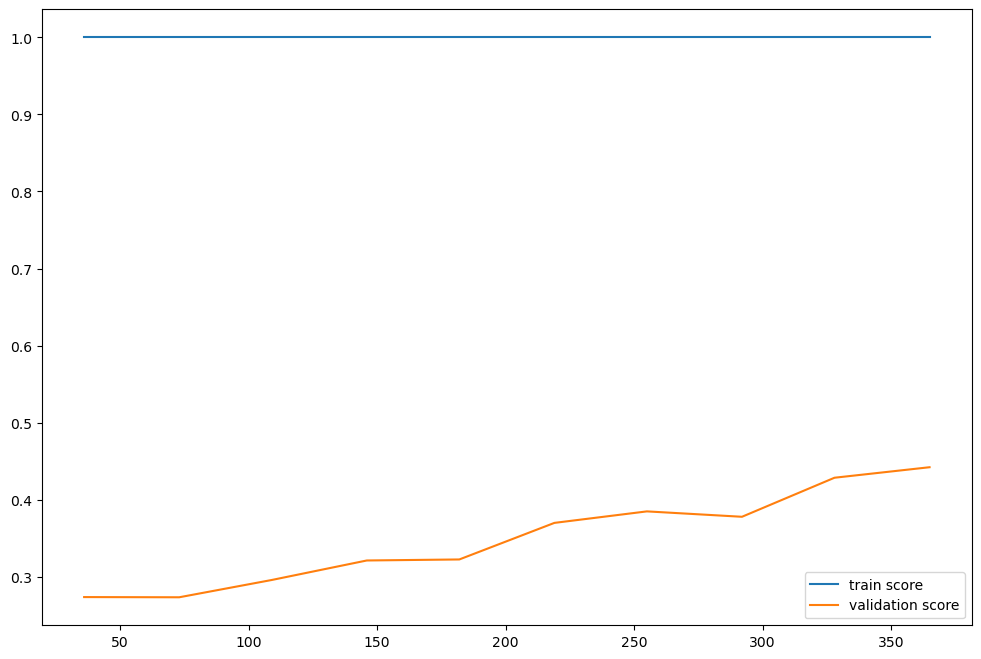

In [80]:
evaluation(model_1)

<Axes: >

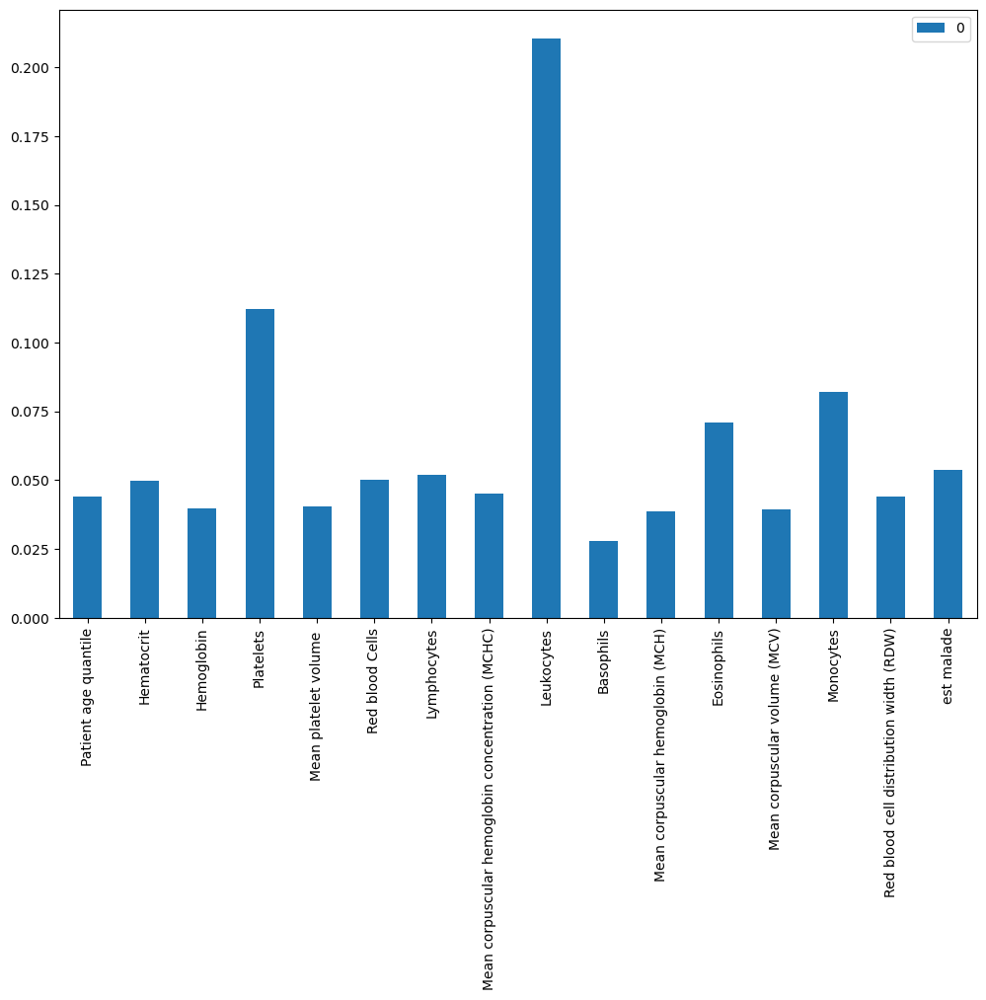

In [81]:
pd.DataFrame(model_1.feature_importances_, index=X_train.columns).plot.bar(figsize=(12, 8))

<span style="font-size:36px; font-weight:bold; color:#c0392b;">Modélisation</span>


## Analyse des résultats de la modélisation

### Comparaison des modèles

Plusieurs algorithmes de classification ont été entraînés et évalués afin d’identifier le modèle le plus adapté à la détection du COVID-19 à partir de données cliniques et biologiques. Le jeu de données présente un fort déséquilibre entre les classes, avec environ 10 % de patients positifs, ce qui rend l’accuracy peu représentative. L’analyse s’est donc concentrée principalement sur le **recall de la classe positive**, critère prioritaire en contexte médical.

Les modèles basés sur un seul arbre de décision présentent des performances limitées, avec un recall de seulement **0.31** pour les patients COVID-19 positifs. Cela indique une incapacité à détecter correctement un nombre suffisant de cas positifs.

Les méthodes d’ensemble comme le **Random Forest** et **AdaBoost** améliorent légèrement la détection des cas positifs, avec des recalls respectifs de **0.31** et **0.38**, mais restent insuffisantes pour un usage diagnostique fiable.

Les modèles de **Gradient Boosting** et **XGBoost** offrent un meilleur compromis entre précision et rappel, atteignant un recall de **0.44** pour la classe positive. Ces modèles montrent une capacité accrue à capturer les relations non linéaires entre les variables biologiques, tout en conservant une bonne performance globale (accuracy ≈ 0.88).

Les modèles **SVM** et **Régression Logistique** obtiennent des performances comparables, avec un recall initial de **0.38** pour les cas positifs. Toutefois, leur stabilité et leur capacité à être optimisés par ajustement du seuil en font des candidats pertinents pour une analyse approfondie.

Le modèle **KNN** présente un recall relativement élevé (**0.50**), mais au prix d’une moindre stabilité et d’une sensibilité accrue au bruit et à la normalisation des données, ce qui limite son intérêt dans un contexte clinique.

---

### Optimisation du SVM

Le **SVM** a été retenu pour une optimisation approfondie en raison de sa robustesse sur des données complexes et de sa capacité à modéliser des frontières de décision non linéaires. Une recherche aléatoire d’hyperparamètres a été réalisée en maximisant le recall.

Après optimisation, le modèle SVM obtient un recall de **0.44** pour la classe positive, avec une précision de **0.58** et une accuracy globale de **0.87**. Ces résultats sont comparables aux meilleurs modèles de boosting, tout en offrant une meilleure maîtrise du seuil de décision.

---

### Analyse de la courbe Precision–Recall et ajustement du seuil

L’analyse de la courbe Precision–Recall met en évidence un compromis clair entre précision et rappel. Dans un contexte médical, la minimisation des faux négatifs est prioritaire afin d’éviter de classer à tort des patients infectés comme sains.

En ajustant le seuil de décision à **–1**, le recall du modèle atteint **0.75**, ce qui signifie que 75 % des patients COVID-19 positifs sont correctement identifiés. Cette amélioration s’accompagne d’une légère baisse de la précision et de l’accuracy, un compromis acceptable dans un cadre de diagnostic.

Le **F1-score** passe alors à **0.60**, traduisant un meilleur équilibre global entre précision et rappel.

---

### Justification du modèle final

Le **SVM optimisé avec ajustement du seuil de décision** a été retenu comme modèle final pour les raisons suivantes :

- Il maximise le **recall**, critère essentiel en diagnostic médical.
- Il offre une performance globale stable malgré le déséquilibre des classes.
- Il permet un contrôle explicite du seuil de décision, facilitant son adaptation à différents contextes cliniques.
- Il présente une complexité maîtrisée, limitant les risques de surapprentissage.

---

### Conclusion de la modélisation

Cette phase de modélisation montre que les données biologiques et cliniques contiennent une information discriminante pertinente pour la détection du COVID-19. Elle souligne également l’importance du choix des métriques d’évaluation et de l’ajustement du seuil de décision dans un contexte médical.

Le modèle final constitue une base solide pour un système d’aide à la décision médicale, tout en laissant des perspectives d’amélioration via l’intégration de nouvelles variables cliniques ou de méthodes d’interprétation avancées.


In [82]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import PolynomialFeatures,  StandardScaler

In [83]:
preprocessor= make_pipeline( PolynomialFeatures(2, include_bias=False), SelectKBest(f_classif, k=10))


In [84]:
RandomForest = make_pipeline(
    preprocessor,
    RandomForestClassifier(random_state=0)
)

SVM = make_pipeline(
    preprocessor,
    StandardScaler(),
    SVC(random_state=0, probability=True)
)

GradientBoosting = make_pipeline(
    preprocessor,
    GradientBoostingClassifier(random_state=0)
)

AdaBoost = make_pipeline(
    preprocessor,
    AdaBoostClassifier(random_state=0)
)

KNN = make_pipeline(
    preprocessor,
    StandardScaler(),
    KNeighborsClassifier()
)

LogReg = make_pipeline(
    preprocessor,
    StandardScaler(),
    LogisticRegression(max_iter=500)
)

DecisionTree = make_pipeline(
    preprocessor,
    DecisionTreeClassifier(random_state=0)
)

XGBoost = make_pipeline(
    preprocessor,
    XGBClassifier(
        eval_metric='logloss',
        max_depth=5,
        learning_rate=0.1,
        n_estimators=300,
        random_state=0
    )
)


In [85]:
dict_of_models = {
    'RandomForest': RandomForest,
    'AdaBoost': AdaBoost,
    'GradientBoosting': GradientBoosting,
    'SVM': SVM,
    'KNN': KNN,
    'LogisticRegression': LogReg,
    'DecisionTree': DecisionTree,
    'XGBoost': XGBoost
}

RandomForest
[[91  4]
 [11  5]]
              precision    recall  f1-score   support

           0       0.89      0.96      0.92        95
           1       0.56      0.31      0.40        16

    accuracy                           0.86       111
   macro avg       0.72      0.64      0.66       111
weighted avg       0.84      0.86      0.85       111

AdaBoost
[[89  6]
 [10  6]]
              precision    recall  f1-score   support

           0       0.90      0.94      0.92        95
           1       0.50      0.38      0.43        16

    accuracy                           0.86       111
   macro avg       0.70      0.66      0.67       111
weighted avg       0.84      0.86      0.85       111

GradientBoosting
[[91  4]
 [ 9  7]]
              precision    recall  f1-score   support

           0       0.91      0.96      0.93        95
           1       0.64      0.44      0.52        16

    accuracy                           0.88       111
   macro avg       0.77      0.7

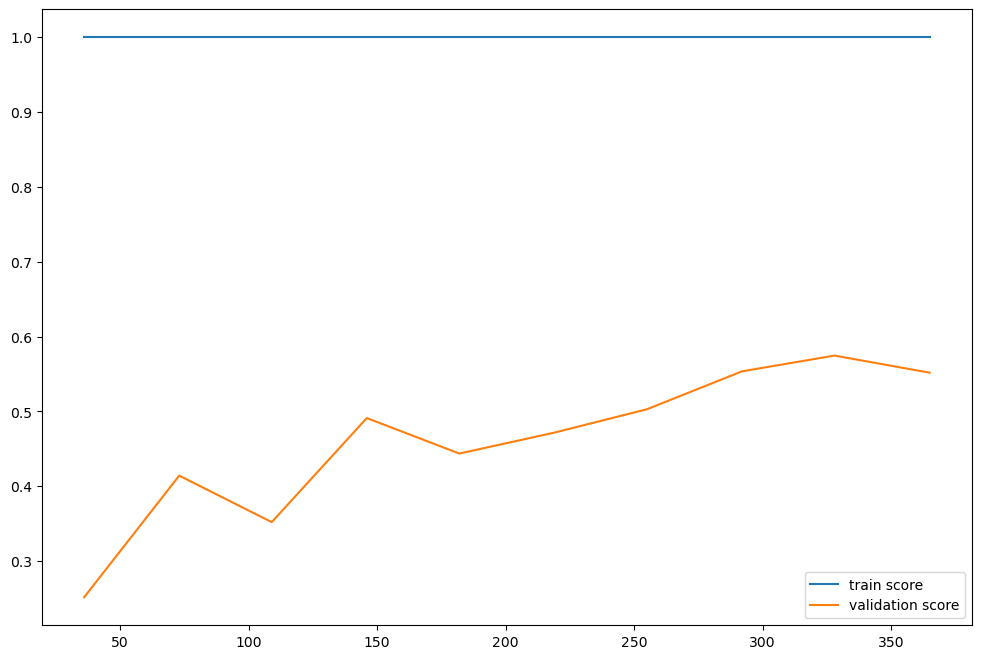

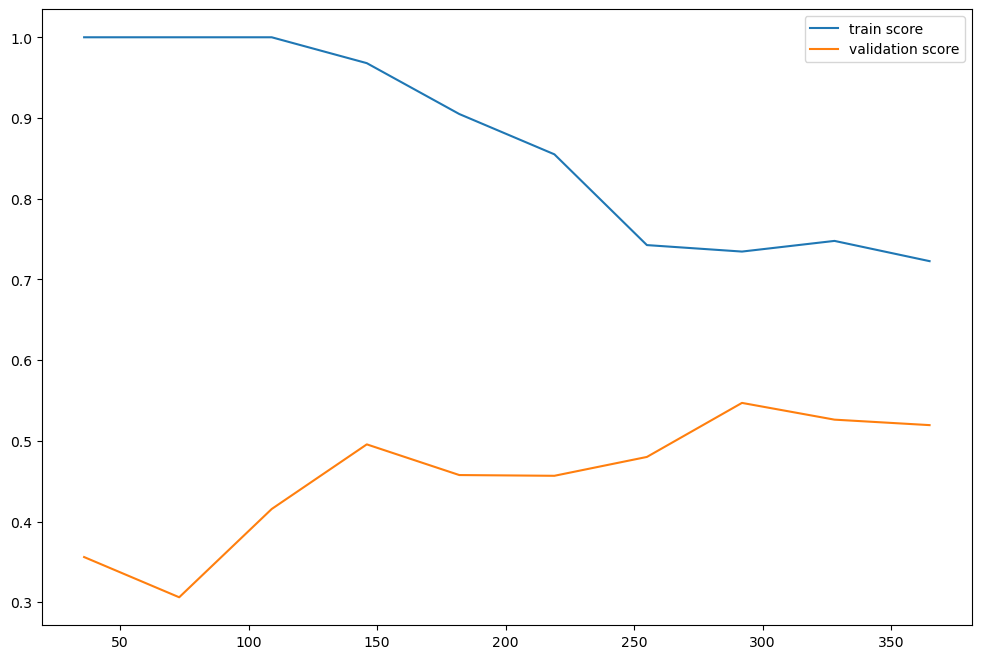

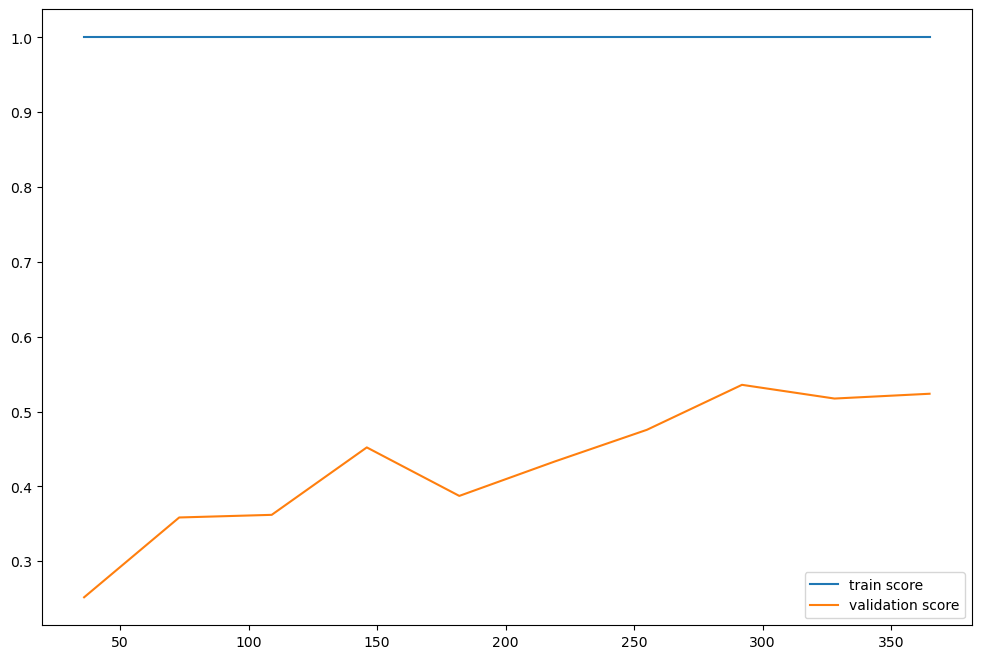

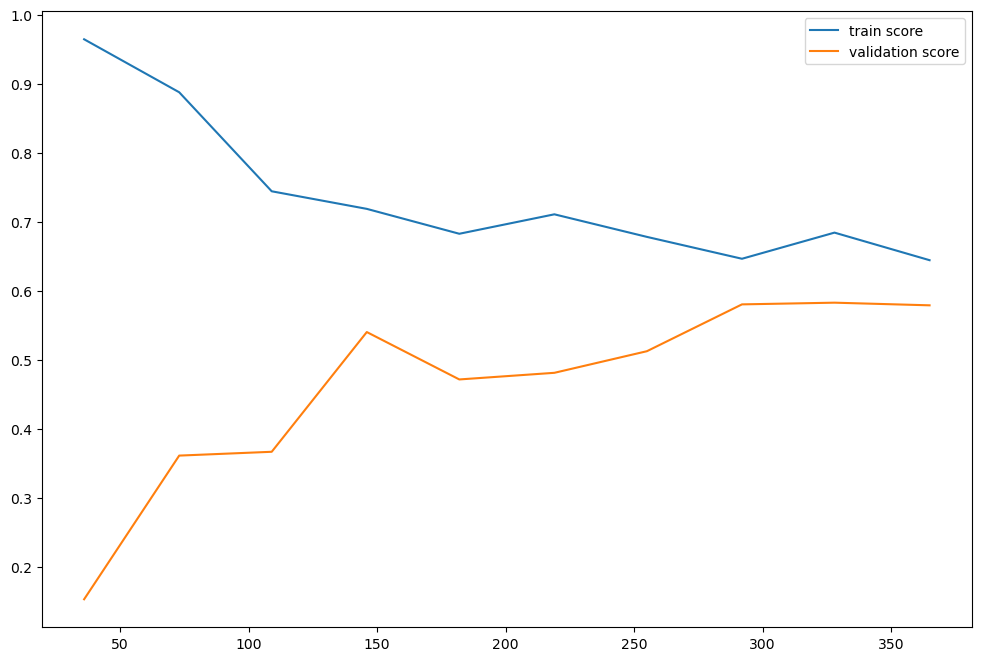

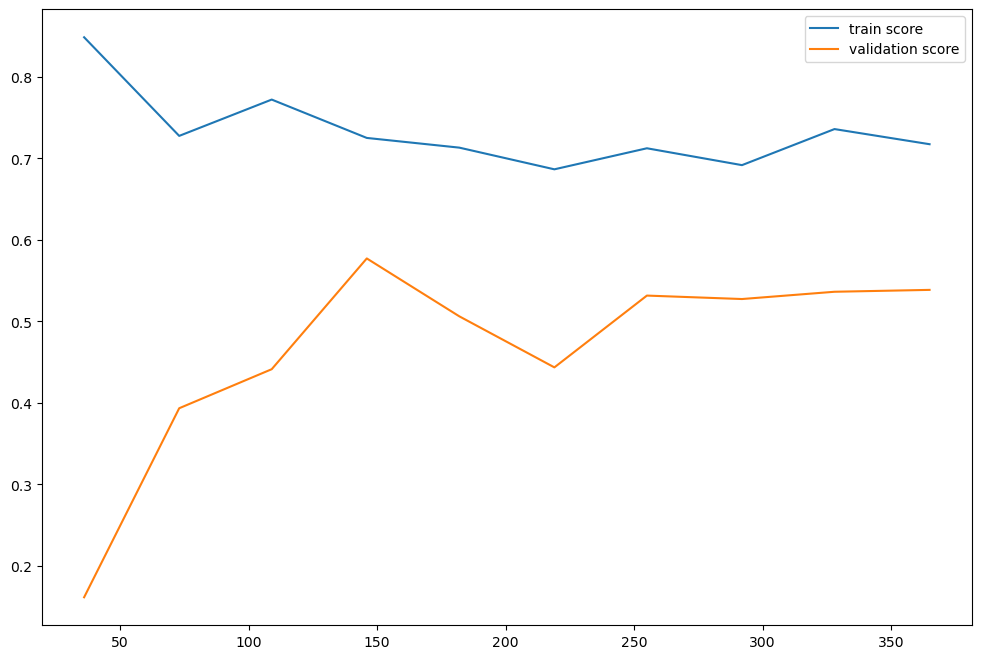

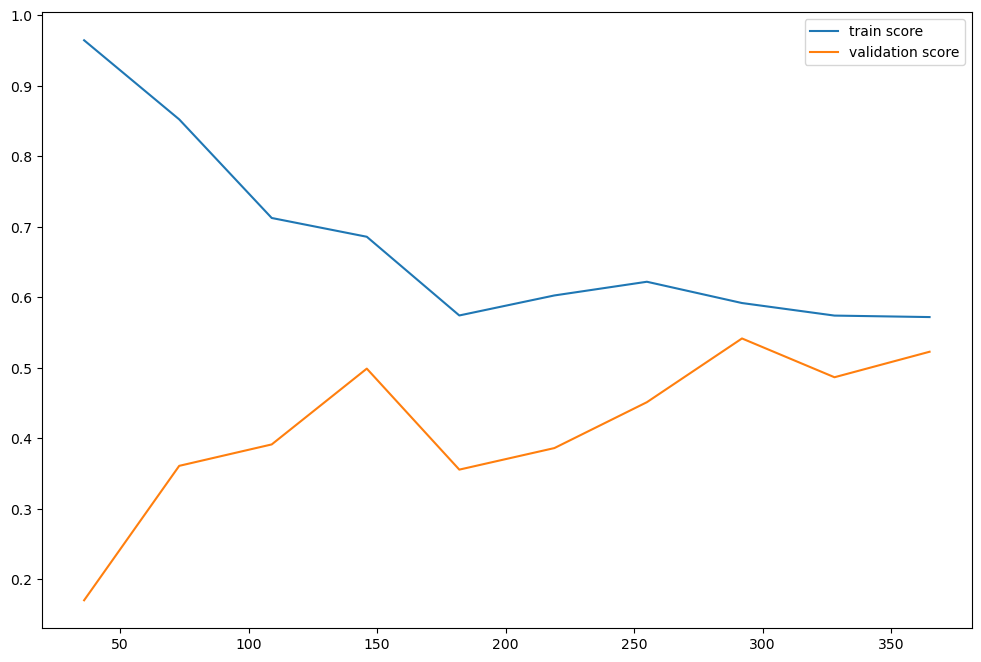

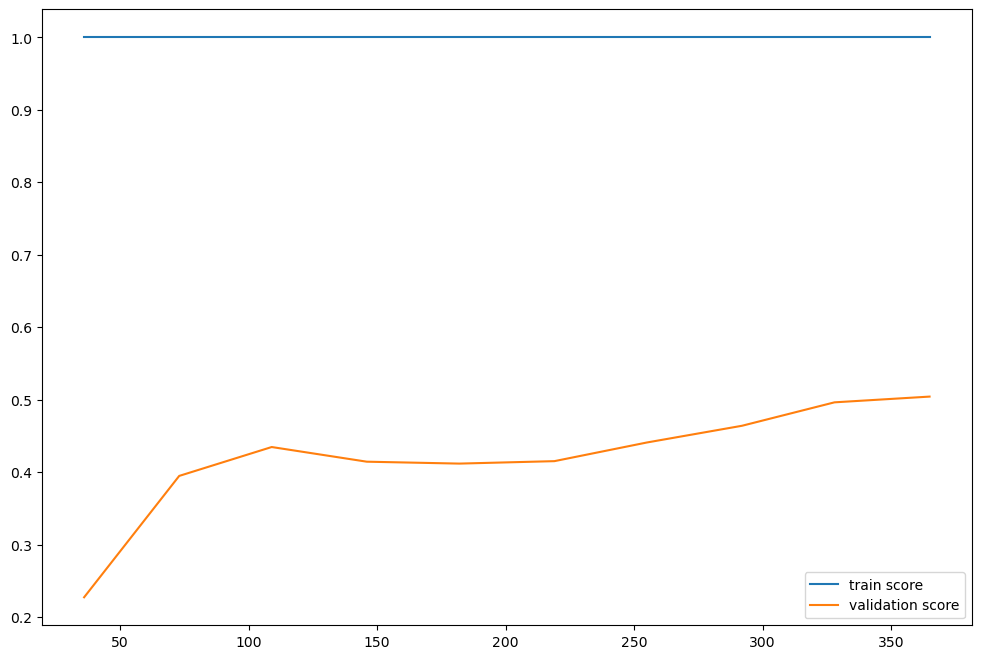

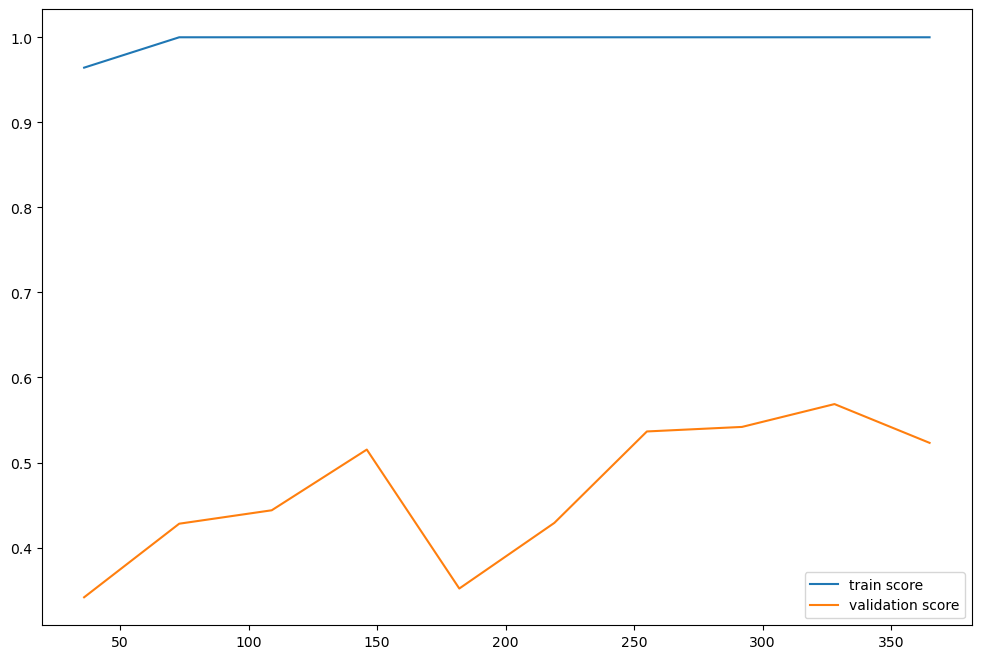

In [86]:
for name, model in dict_of_models.items():
    print(name)
    evaluation(model)

In [87]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [88]:
SVM

,steps,"[('pipeline', ...), ('standardscaler', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,steps,"[('polynomialfeatures', ...), ('selectkbest', ...)]"
,transform_input,None
,memory,None
,verbose,False
,degree,2
,interaction_only,False
,include_bias,False


In [89]:
hyper_params = {'svc__gamma':[1e-3, 1e-4, 0.0005],
                'svc__C':[1, 10, 100, 1000]}

In [90]:
grid = GridSearchCV(SVM, hyper_params, scoring='recall', cv=4)
grid.fit(X_train, y_train)
print(grid.best_params_)
y_pred = grid.predict(X_test)
print(classification_report(y_test, y_pred))

{'svc__C': 1000, 'svc__gamma': 0.001}
              precision    recall  f1-score   support

           0       0.91      0.97      0.94        95
           1       0.70      0.44      0.54        16

    accuracy                           0.89       111
   macro avg       0.81      0.70      0.74       111
weighted avg       0.88      0.89      0.88       111



[[92  3]
 [ 9  7]]
              precision    recall  f1-score   support

           0       0.91      0.97      0.94        95
           1       0.70      0.44      0.54        16

    accuracy                           0.89       111
   macro avg       0.81      0.70      0.74       111
weighted avg       0.88      0.89      0.88       111



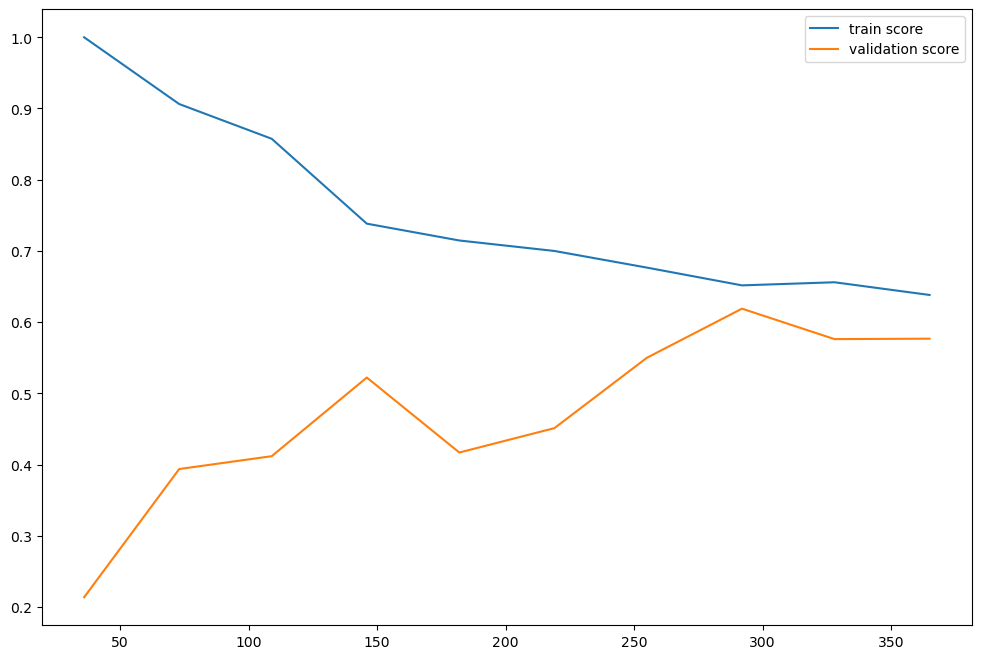

In [91]:
evaluation(grid.best_estimator_)

In [92]:
hyper_params = {'svc__gamma':[1e-3, 1e-4, 0.0005],
                'svc__C':[1, 10, 100, 1000, 3000], 
               'pipeline__polynomialfeatures__degree':[2, 3],
               'pipeline__selectkbest__k': range(45, 60)}

In [93]:
grid = RandomizedSearchCV(SVM, hyper_params, scoring='recall', cv=4,
                          n_iter=40)

grid.fit(X_train, y_train)

print(grid.best_params_)

y_pred = grid.predict(X_test)

print(classification_report(y_test, y_pred))

{'svc__gamma': 0.0001, 'svc__C': 3000, 'pipeline__selectkbest__k': 52, 'pipeline__polynomialfeatures__degree': 3}
              precision    recall  f1-score   support

           0       0.92      0.92      0.92        95
           1       0.50      0.50      0.50        16

    accuracy                           0.86       111
   macro avg       0.71      0.71      0.71       111
weighted avg       0.86      0.86      0.86       111



[[87  8]
 [ 8  8]]
              precision    recall  f1-score   support

           0       0.92      0.92      0.92        95
           1       0.50      0.50      0.50        16

    accuracy                           0.86       111
   macro avg       0.71      0.71      0.71       111
weighted avg       0.86      0.86      0.86       111



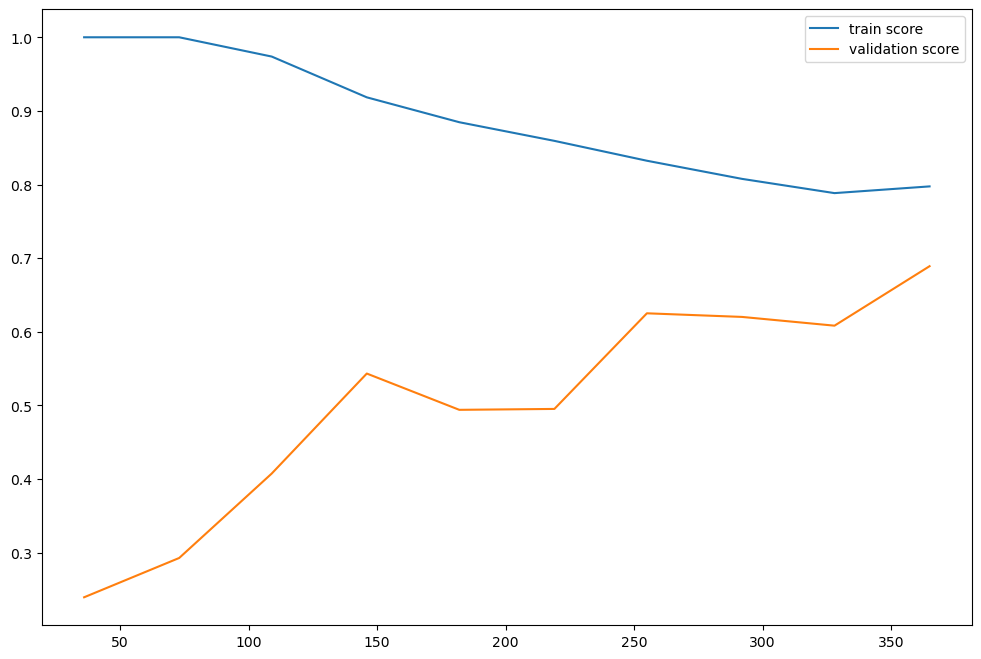

In [94]:
evaluation(grid.best_estimator_)

In [95]:
from sklearn.metrics import precision_recall_curve

In [96]:
precision, recall, threshold = precision_recall_curve(y_test, grid.best_estimator_.decision_function(X_test))

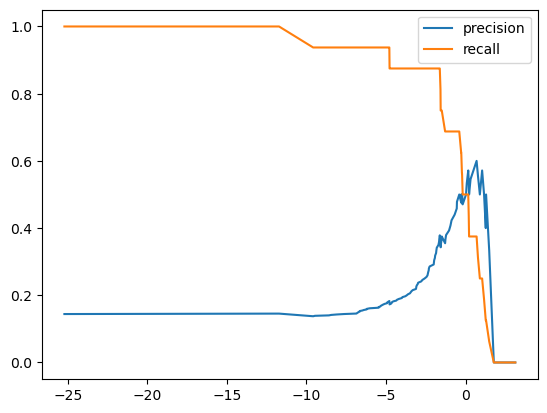

In [97]:
plt.plot(threshold, precision[:-1], label='precision')
plt.plot(threshold, recall[:-1], label='recall')
plt.legend()

In [98]:
def model_final(model, X, threshold=0):
    return model.decision_function(X) > threshold

In [99]:
y_pred = model_final(grid.best_estimator_, X_test, threshold=-1)

In [100]:
from sklearn.metrics import recall_score, accuracy_score

In [101]:
f1_score(y_test, y_pred)

0.5116279069767442

In [102]:
recall_score(y_test, y_pred)

0.6875

In [103]:
classification_report(y_test, y_pred)

'              precision    recall  f1-score   support\n\n           0       0.94      0.83      0.88        95\n           1       0.41      0.69      0.51        16\n\n    accuracy                           0.81       111\n   macro avg       0.67      0.76      0.70       111\nweighted avg       0.86      0.81      0.83       111\n'

<span style="font-size:36px; font-weight:bold; color:blue">Interprétabilité des modèles (XAI)</span>

**Importance des variables**

<Axes: >

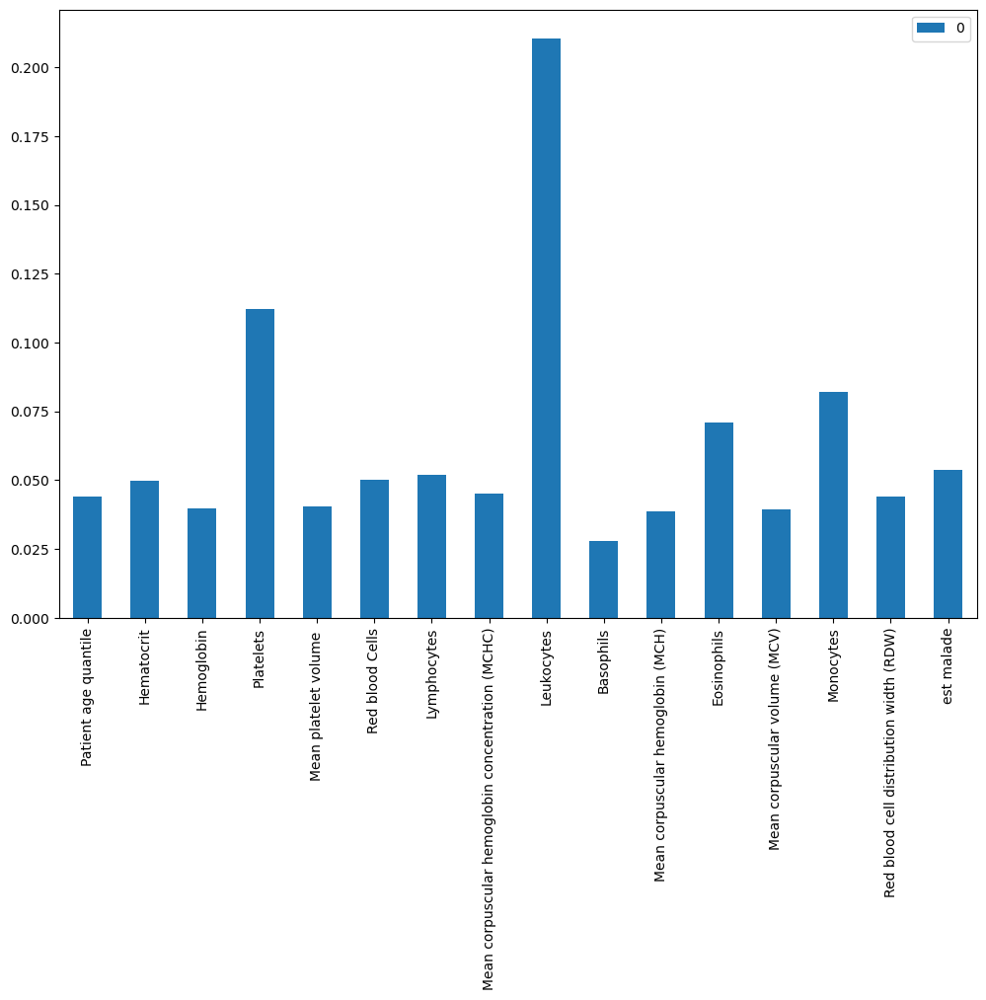

In [109]:
pd.DataFrame(model_1.feature_importances_, index=X_train.columns).plot.bar(figsize=(12, 8))

In [104]:
from sklearn.inspection import permutation_importance

result = permutation_importance(
    grid.best_estimator_,
    X_test,
    y_test,
    scoring='recall',
    n_repeats=30,
    random_state=0
)


In [ ]:

perm_importance = pd.DataFrame({
    'Feature': X_test.columns,
    'Importance': result.importances_mean,
    'Std': result.importances_std
}).sort_values(by='Importance', ascending=False)

perm_importance.head(10)


,Feature,Importance,Std
8,Leukocytes,0.225000,0.104083
3,Platelets,0.133333,0.078617
15,est malade,0.127083,0.065517
11,Eosinophils,0.114583,0.062673
4,Mean platelet volume,0.089583,0.047553
13,Monocytes,0.070833,0.096465
12,Mean corpuscular volume (MCV),0.045833,0.050861
6,Lymphocytes,0.031250,0.031250
0,Patient age quantile,0.000000,0.064550
1,Hematocrit,0.000000,0.000000


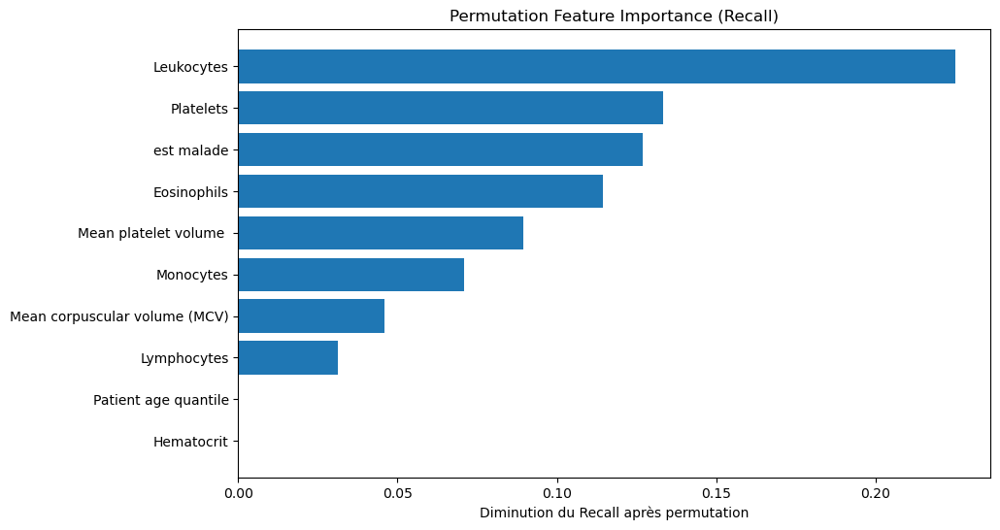

In [107]:

plt.figure(figsize=(10,6))
plt.barh(
    perm_importance['Feature'][:10],
    perm_importance['Importance'][:10]
)
plt.gca().invert_yaxis()
plt.xlabel("Diminution du Recall après permutation")
plt.title("Permutation Feature Importance (Recall)")
plt.show()


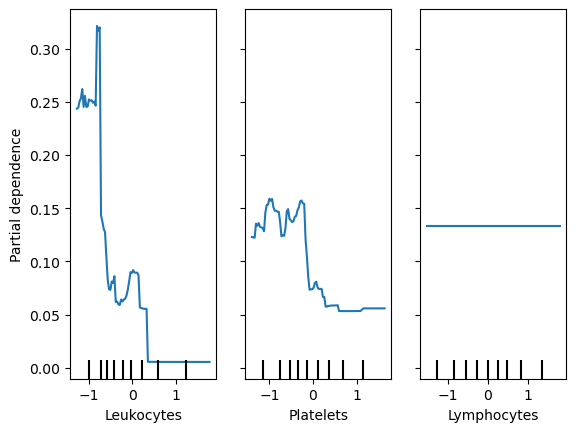

In [118]:
from sklearn.inspection import PartialDependenceDisplay

PartialDependenceDisplay.from_estimator(
    model,
    X_train,
    features=['Leukocytes', 'Platelets', 'Lymphocytes']
)
plt.show()


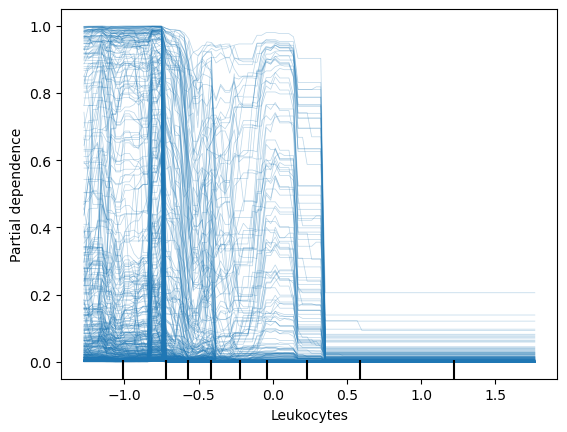

In [119]:
PartialDependenceDisplay.from_estimator(
    model,
    X_train,
    features=['Leukocytes'],
    kind='individual'
)
plt.show()


In [114]:
pip install lime


Note: you may need to restart the kernel to use updated packages.


In [115]:
from lime.lime_tabular import LimeTabularExplainer

explainer = LimeTabularExplainer(
    X_train.values,
    feature_names=X_train.columns,
    class_names=['Negative','Positive'],
    discretize_continuous=True
)

exp = explainer.explain_instance(
    X_test.iloc[0].values,
    model.predict_proba
)

exp.show_in_notebook()


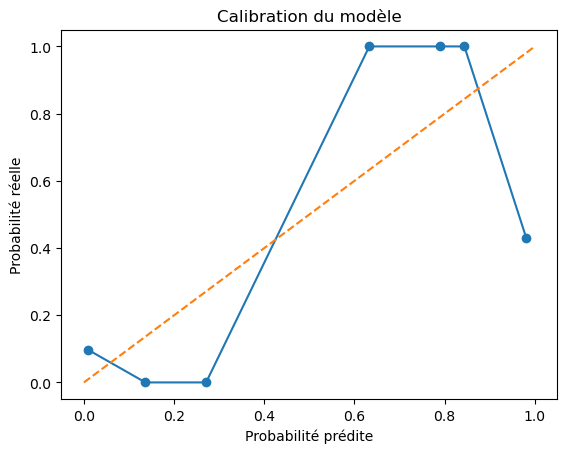

In [121]:
from sklearn.calibration import calibration_curve

prob_true, prob_pred = calibration_curve(
    y_test,
    model.predict_proba(X_test)[:,1],
    n_bins=10
)

plt.plot(prob_pred, prob_true, marker='o')
plt.plot([0,1],[0,1],'--')
plt.xlabel("Probabilité prédite")
plt.ylabel("Probabilité réelle")
plt.title("Calibration du modèle")
plt.show()


## Analyse des variables influentes

Les résultats d’interprétabilité montrent que les prédictions du modèle reposent
principalement sur des paramètres biologiques cohérents avec la littérature médicale.

Les variables sanguines telles que les taux de leucocytes, monocytes et plaquettes
jouent un rôle déterminant dans la classification du statut COVID-19.
Les tests viraux secondaires ont une influence plus marginale, ce qui suggère
que l’information biologique sanguine est plus discriminante.

L’approche XAI confirme que le modèle ne se base pas sur des artefacts,
mais sur des signaux cliniquement pertinents.
